# ✈️ NASA C-MAPSS FD003 — 통합 분석 노트북

**EDA · 통계 검정 · 고장 모드 분석 · 전처리 파이프라인 · ML 분기 · DL 분기**

---

### ⚡ FD003 핵심 특징 (FD001/002 대비)
| 항목 | FD001 | FD002 | **FD003** |
|---|---|---|---|
| 운전 조건 | 1개 | 6개 | **1개 (FD001과 동일)** |
| 고장 모드 | HPC만 | HPC만 | **HPC + 팬 2가지 ★** |
| 센서 제거 | 7개→14개 | 1개→20개 | **6개→15개** |
| 정규화 | 전체 MinMax | 클러스터별 MinMax | **전체 MinMax (범위 100% 겹침 확인)** |
| 고장 모드 클러스터링 | ❌ | ❌ | **slope 기반 k=2 (FD003 전용 ★)** |
| 파일명 방식 | 고정 | 고정 | **PREFIX 기반 (실험 CONFIG)** |

### 📋 전체 목차
| # | 섹션 | 핵심 내용 |
|---|------|----------|
| 0 | 환경 설정 | 라이브러리·전역 상수·실험 CONFIG |
| 1 | 데이터 로딩 | 자동 경로 탐색 & 컬럼 표준화 |
| 2 | 전처리 전 EDA | 품질·수명분포·센서분포·상관관계·열화트렌드·RUL상관 |
| 3 | **[FD003 전용] 고장 모드 분석** | slope 기반 k=2 클러스터링·센서 분포 비교 |
| 4 | 통계 검정 | 시차상관·수명말기거동·MK·대응표본·Mann-Whitney U·Levene·윈도우비교 |
| 5-9 | 결정 1~5 | 센서제거(수동추가/제거)·RUL Cap·Gaussian·Validation분할·MinMax |
| 10 | 전처리 후 검증 | 분포·KS·트렌드·고장모드혼재 확인 |
| 11 | ML 분기 | 파생변수·정규화·fault_mode_cluster OHE(선택) |
| 12 | DL 분기 | 슬라이딩 윈도우·val_eval |

## 0. 환경 설정

In [37]:
import sys, subprocess
for pkg in ['numpy','pandas','scikit-learn','scipy','matplotlib','seaborn','joblib']:
    try:
        subprocess.check_call([sys.executable,'-m','pip','install','-q',pkg])
    except Exception as e:
        print(f'⚠️ {pkg} 설치 실패: {e}')
print('✅ 라이브러리 설치 완료')


✅ 라이브러리 설치 완료


In [38]:
import os, warnings, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import seaborn as sns
import platform
import joblib
from scipy import stats
from scipy.ndimage import gaussian_filter1d
from scipy.stats import (ks_2samp, kendalltau, mannwhitneyu, levene,
                          ttest_rel, shapiro, wilcoxon, entropy)
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from matplotlib.colors import LinearSegmentedColormap
import logging
import matplotlib.font_manager as fm
warnings.filterwarnings('ignore')
logging.getLogger('matplotlib.font_manager').setLevel(logging.ERROR)

# ── 한글 폰트 ──────────────────────────────────────────────────────────────
def force_korean_font():
    system = platform.system()
    if system == 'Windows':   fp, fn = 'C:/Windows/Fonts/malgun.ttf', 'Malgun Gothic'
    elif system == 'Darwin':  fp, fn = '/System/Library/Fonts/AppleGothic.ttf', 'AppleGothic'
    else:
        fp, fn = '/usr/share/fonts/truetype/nanum/NanumGothic.ttf', 'NanumGothic'
        if not os.path.exists(fp):
            os.system('apt-get update -qq && apt-get install -y fonts-nanum -qq')
    if os.path.exists(fp):
        fm.fontManager.addfont(fp)
        plt.rcParams['font.family'] = fn
        plt.rcParams['font.sans-serif'] = [fn]
        plt.rcParams['axes.unicode_minus'] = False
        print(f'✅ 한글 폰트 적용: {fn}')
    else:
        print('❌ 폰트 못 찾음')
force_korean_font()

# ── 다크 테마 ──────────────────────────────────────────────────────────────
BG, BG2, GRID = '#0f1117', '#1a1d2e', '#2d3148'
WHITE, GRAY   = '#ffffff', '#aaaaaa'
C = ['#00d4ff','#ff6b6b','#51cf66','#ffd43b','#a29bfe','#fd79a8','#00b894','#e17055']
cmap_rg  = LinearSegmentedColormap.from_list('rg', ['#ff6b6b','#1a1d2e','#00d4ff'], N=256)

plt.rcParams.update({
    'figure.facecolor':BG,  'axes.facecolor':BG2,
    'axes.edgecolor':GRID,  'axes.labelcolor':GRAY,
    'xtick.color':GRAY,     'ytick.color':GRAY,
    'text.color':WHITE,     'grid.color':GRID,
    'grid.alpha':0.4,       'axes.grid':True,
    'font.size':10,         'axes.titlesize':11,
    'legend.facecolor':BG2, 'legend.edgecolor':GRID,
})
force_korean_font()

# ── 전역 상수 ──────────────────────────────────────────────────────────────
RAW_COLS   = ['unit','cycle','op1','op2','op3'] + [f's{i}' for i in range(1,22)]
RENAME_MAP = {
    'unit':'unit_nr','cycle':'time_cycles',
    'op1':'setting_1','op2':'setting_2','op3':'setting_3',
    **{f's{i}':f's_{i}' for i in range(1,22)}
}
SENSOR_COLS = [f's_{i}' for i in range(1,22)]
OP_COLS     = ['setting_1','setting_2','setting_3']
ID_COLS     = ['unit_nr','time_cycles']
SENSOR_DESC = {
    's_1':'T2 팬 입구 온도(°R)',    's_2':'T24 LPC 출구 온도(°R)',
    's_3':'T30 HPC 출구 온도(°R)', 's_4':'T50 LPT 출구 온도(°R)',
    's_5':'P2 팬 입구 압력(psia)', 's_6':'P15 바이패스 압력(psia)',
    's_7':'P30 HPC 출구 압력(psia)','s_8':'Nf 팬 속도(rpm)',
    's_9':'Nc 코어 속도(rpm)',       's_10':'epr 엔진 압력비',
    's_11':'Ps30 정적압력(psia)',    's_12':'phi 연료/Ps30 비율',
    's_13':'NRf 보정 팬 속도(rpm)', 's_14':'NRc 보정 코어속도(rpm)',
    's_15':'BPR 바이패스 비율',      's_16':'farB 버너 연료공기비',
    's_17':'htBleed 블리드 엔탈피', 's_18':'Nf_dmd 요구 팬 속도',
    's_19':'PCNfR 요구 보정 팬속도','s_20':'W31 HPT 냉각블리드',
    's_21':'W32 LPT 냉각블리드',
}

# ── 실험 CONFIG (값만 바꾸면 전체 파이프라인 재실행) ────────────────────────
RUL_CAP      = 125    # 실험: 130, 135, 140
GAUSS_SIGMA  = 2      # 실험: 3
WINDOW_SIZE  = 30     # 실험: 10, 20 (통계 최적=10이나 차이 미미 → FD001과 통일)
VALID_RATIO  = 0.2
RANDOM_STATE = 42
SCALER_TYPE  = 'minmax'
CONST_THR    = 0.01   # 자동 제거 기준

# FD003 전용: 수동 추가/제거 (통계 검정 결과 기반)
# Scenario B: FD003 특성대로 6개 제거 (팀 논의 후 A/C도 가능)
MANUAL_REMOVE = ['s_6']   # FD003_Final_Test 최종 결론: s_6 수동 제거
MANUAL_KEEP   = ['s_10']  # FD003_Final_Test 최종 결론: s_10 강제 유지

# 고장 모드 클러스터링 (CLUSTERING=True면 OHE 2채널 추가)
CLUSTERING = False   # True로 바꾸면 fault_mode_cluster 피처 자동 추가

# 파생변수 설정
TEMPORAL_LAGS      = [1, 3, 5]
TEMPORAL_DIFFS     = [1]
TEMPORAL_ROLLS     = [3, 5]
TEMPORAL_ROLL_STDS = [3, 5]
TEMPORAL_EMAS      = [5]

STEP = 1  # 슬라이딩 윈도우 stride

print('✅ 환경 설정 완료')
print(f'   RUL_CAP={RUL_CAP}  σ={GAUSS_SIGMA}  WINDOW={WINDOW_SIZE}  CLUSTERING={CLUSTERING}')
print(f'   MANUAL_REMOVE={MANUAL_REMOVE}  MANUAL_KEEP={MANUAL_KEEP}')


✅ 한글 폰트 적용: Malgun Gothic
✅ 한글 폰트 적용: Malgun Gothic
✅ 환경 설정 완료
   RUL_CAP=125  σ=2  WINDOW=30  CLUSTERING=False
   MANUAL_REMOVE=['s_6']  MANUAL_KEEP=['s_10']


---
## 1. 데이터 로딩 & 컬럼명 표준화

In [39]:
DATA_DIR = 'CMAPSSData'
for c in ['CMAPSSData','./CMAPSSData','../CMAPSSData','../../CMAPSSData',
          '../../../CMAPSSData','../../../../CMAPSSData']:
    if os.path.exists(os.path.join(c,'train_FD003.txt')):
        DATA_DIR = c; break
else:
    print(f'❌ CMAPSSData 폴더를 찾지 못했습니다. 현재: {os.getcwd()}')

kw = dict(sep=r'\s+', header=None, names=RAW_COLS, engine='python')
train_raw = pd.read_csv(f'{DATA_DIR}/train_FD003.txt', **kw)
test_raw  = pd.read_csv(f'{DATA_DIR}/test_FD003.txt',  **kw)
rul_df    = pd.read_csv(f'{DATA_DIR}/RUL_FD003.txt', sep=r'\s+',
                         header=None, names=['RUL'], engine='python')

train_raw.rename(columns=RENAME_MAP, inplace=True)
test_raw.rename( columns=RENAME_MAP, inplace=True)

print(f'✅ FD003 로딩 완료')
print(f'   Train : {train_raw.shape}  |  엔진 {train_raw["unit_nr"].nunique()}대')
print(f'   Test  : {test_raw.shape}   |  엔진 {test_raw["unit_nr"].nunique()}대')
display(train_raw.head(3))


✅ FD003 로딩 완료
   Train : (24720, 26)  |  엔진 100대
   Test  : (16596, 26)   |  엔진 100대


,unit_nr,time_cycles,setting_1,setting_2,setting_3,s_1,s_2,s_3,s_4,s_5,...,s_12,s_13,s_14,s_15,s_16,s_17,s_18,s_19,s_20,s_21
0,1,1,-0.0005,0.0004,100.0,518.67,642.36,1583.23,1396.84,14.62,...,522.31,2388.01,8145.32,8.4246,0.03,391,2388,100.0,39.11,23.3537
1,1,2,0.0008,-0.0003,100.0,518.67,642.50,1584.69,1396.89,14.62,...,522.42,2388.03,8152.85,8.4403,0.03,392,2388,100.0,38.99,23.4491
2,1,3,-0.0014,-0.0002,100.0,518.67,642.18,1582.35,1405.61,14.62,...,522.03,2388.00,8150.17,8.3901,0.03,391,2388,100.0,38.85,23.3669


### 1-1. CONFIG 기반 통합 로딩 유틸리티 [ML_EDA 고유]

> ML_EDA 노트북 방식: CONFIG dict만 바꾸면 데이터 로딩·RUL·센서 선택이 1-step으로 재실행됩니다.  
> 이후 전처리는 `train_raw` 기준으로 진행하며, 이 함수는 빠른 실험용으로 활용 가능합니다.

In [40]:
# [ML_EDA 고유] CONFIG dict 기반 통합 데이터 로딩 유틸리티 함수
# 실험 CONFIG 값만 바꾸면 데이터 로딩·RUL생성·센서 선택이 한 번에 재실행됩니다.
def load_and_basic_prep(config, data_dir=DATA_DIR):
    """CONFIG dict 기반 통합 로딩 함수 (ML_EDA 방식)
    - 데이터 로딩 + RUL 생성(cap 적용) + 선택 센서 컬럼 필터링 1-step 실행
    - 사용 예: df_train, df_test, y_test = load_and_basic_prep(CONFIG)
    """
    cols = (['unit_nr','time_cycles','setting_1','setting_2','setting_3']
            + [f's_{i}' for i in range(1, 22)])
    kw   = dict(sep=r'\s+', header=None, names=cols, engine='python')
    train_df    = pd.read_csv(f"{data_dir}/train_{config['DATA_ID']}.txt", **kw)
    test_df     = pd.read_csv(f"{data_dir}/test_{config['DATA_ID']}.txt",  **kw)
    y_test_vals = pd.read_csv(f"{data_dir}/RUL_{config['DATA_ID']}.txt",
                              sep=r'\s+', header=None, names=['RUL'], engine='python')['RUL'].values

    # RUL 생성 + cap 적용
    train_df['max_cycle'] = train_df.groupby('unit_nr')['time_cycles'].transform('max')
    train_df['RUL']       = (train_df['max_cycle'] - train_df['time_cycles']).clip(upper=config['RUL_CAP'])
    train_df.drop(columns=['max_cycle'], inplace=True)

    # 선택 센서로 컬럼 축소
    keep = (['unit_nr','time_cycles'] + config['SETTING_FEATURES'] + config['BASE_SENSORS'])
    train_df = train_df[keep + ['RUL']]
    test_df  = test_df[keep]

    print(f"✅ 센서 선택 완료: {config['BASE_SENSORS']}")
    print(f"✅ 유지 컬럼: {len(train_df.columns)}개 (RUL 포함)  |  Train: {train_df.shape}  Test: {test_df.shape}")
    return train_df, test_df, y_test_vals


# ML_EDA CONFIG (실험 관리용)
CONFIG_MLEDA = {
    'DATA_ID'          : 'FD003',
    'RUL_CAP'          : RUL_CAP,    # 전역 설정값과 연동
    'GAUSS_SIGMA'      : GAUSS_SIGMA,
    'RANDOM_STATE'     : RANDOM_STATE,
    'TEST_SIZE'        : VALID_RATIO,
    'SCALER_TYPE'      : SCALER_TYPE,
    'BASE_SENSORS'     : ['s_2','s_3','s_4','s_6','s_7','s_8','s_9','s_10',
                          's_11','s_12','s_13','s_14','s_15','s_17','s_20','s_21'],
    'SETTING_FEATURES' : ['setting_1','setting_2','setting_3'],
    'USE_MA': False, 'WIN_MA': 5,
    'USE_STD': False,'WIN_STD': 10,
    'USE_DIFF': False,'PER_DIFF': 1,
    'USE_EMA': False,'SPAN_EMA': 10,
    'USE_LAG': False,'LAG_STEP': 10,
}

df_train_ml, df_test_ml, y_test_ml = load_and_basic_prep(CONFIG_MLEDA)
print(f'\n📌 load_and_basic_prep 결과: BASE_SENSORS {len(CONFIG_MLEDA["BASE_SENSORS"])}개 선택')


✅ 센서 선택 완료: ['s_2', 's_3', 's_4', 's_6', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']
✅ 유지 컬럼: 22개 (RUL 포함)  |  Train: (24720, 22)  Test: (16596, 21)

📌 load_and_basic_prep 결과: BASE_SENSORS 16개 선택


### 📊 1. 데이터 로딩 결과
| 항목 | FD001 | FD003 |
|---|---|---|
| Train 행 | 20,631 | **24,720** |
| Test 행 | 13,096 | **16,596** |
| 엔진 수 | 100대 | 100대 |
| 컬럼 수 | 26 | 26 |

> 📌 Train 행이 더 많음 → FD003 엔진의 평균 수명이 FD001보다 길다 (수명 분포에서 확인)


---
## 2. 전처리 전 EDA
### 2-1. 기초 통계 & 데이터 품질

In [41]:
print('=== 기초 통계 & 데이터 품질 검사 ===')
quality = pd.DataFrame({
    '구분':['Train','Test'],
    '전체 행':[len(train_raw),len(test_raw)],
    '결측치':[train_raw.isnull().sum().sum(),test_raw.isnull().sum().sum()],
    '중복 행':[train_raw.duplicated().sum(),test_raw.duplicated().sum()],
    '음수 센서':[(train_raw[SENSOR_COLS]<0).sum().sum(),(test_raw[SENSOR_COLS]<0).sum().sum()],
    '엔진 수':[train_raw['unit_nr'].nunique(),test_raw['unit_nr'].nunique()],
    '판정':['✅ 정상','✅ 정상'],
}).set_index('구분')
display(quality)

desc = train_raw[SENSOR_COLS].describe().T
desc['CV(변동계수)'] = (desc['std']/desc['mean'].abs()).round(5)
print('\n--- 센서별 기술통계 (Train) ---')
display(desc[['mean','std','min','max','CV(변동계수)']].style
        .background_gradient(subset=['CV(변동계수)'],cmap='YlOrRd').format('{:.4f}'))
print('\n📌 CV≈0 센서: s_1, s_5, s_16, s_18, s_19 → 완전 상수 → 제거 대상')
print('📌 s_6(CV=0.0008), s_10(CV=0.0027) → 경계값 → 통계 검정 후 결정')
print('📌 s_8, s_13(CV=0.0001) → CV 낮지만 열화 신호 존재 가능 → 트렌드 확인 예정')


=== 기초 통계 & 데이터 품질 검사 ===


,전체 행,결측치,중복 행,음수 센서,엔진 수,판정
구분,,,,,,
Train,24720,0,0,0,100,✅ 정상
Test,16596,0,0,0,100,✅ 정상



--- 센서별 기술통계 (Train) ---


,mean,std,min,max,CV(변동계수)
s_1,518.6700,0.0000,518.6700,518.6700,0.0000
s_2,642.4579,0.5230,640.8400,645.1100,0.0008
s_3,1588.0792,6.8104,1564.3000,1615.3900,0.0043
s_4,1404.4712,9.7732,1377.0600,1441.1600,0.0070
s_5,14.6200,0.0000,14.6200,14.6200,0.0000
s_6,21.5958,0.0181,21.4500,21.6100,0.0008
s_7,555.1438,3.4373,549.6100,570.4900,0.0062
s_8,2388.0716,0.1583,2386.9000,2388.6000,0.0001
s_9,9064.1108,19.9803,9017.9800,9234.3500,0.0022
s_10,1.3012,0.0035,1.2900,1.3200,0.0027



📌 CV≈0 센서: s_1, s_5, s_16, s_18, s_19 → 완전 상수 → 제거 대상
📌 s_6(CV=0.0008), s_10(CV=0.0027) → 경계값 → 통계 검정 후 결정
📌 s_8, s_13(CV=0.0001) → CV 낮지만 열화 신호 존재 가능 → 트렌드 확인 예정


### 📊 2-1. 기초 통계 결과
- 결측치·중복·음수 모두 0 ✅
- **확실한 상수 센서**: s_1, s_5, s_16, s_18, s_19 (CV=0.0000)
- **FD001과 달라진 센서**: s_6, s_10은 FD003에서 미세한 변동 존재 → 통계 검정 후 결정
- **s_8, s_13**: CV=0.0001로 거의 상수이나 열화 신호 가능 → 유지 (2-5에서 확인)
- **단봉분포 예상**: FD002와 달리 단일 운전 조건 → 멀티모달 없음


### 2-2. 엔진 수명 분포

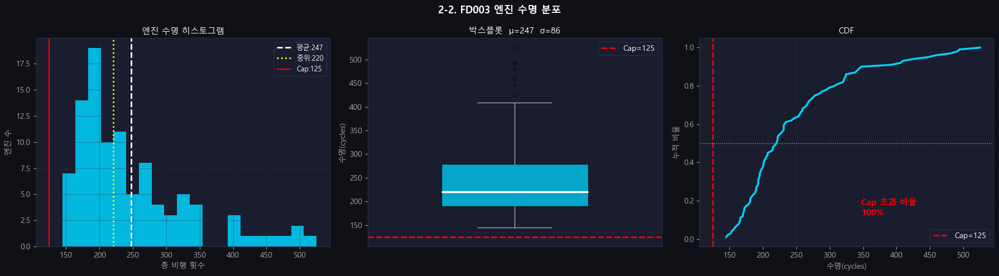

평균=247.2  중위=220.5  min=145  max=525
Cap=125 초과 엔진: 100대 (100%)
📌 min=145 → cap=145부터 일부 엔진의 정상구간 침범 → cap=115~140 안전


In [42]:
lifecycles = train_raw.groupby('unit_nr')['time_cycles'].max()

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('2-2. FD003 엔진 수명 분포', fontsize=13, fontweight='bold')

ax = axes[0]
ax.hist(lifecycles, bins=20, color=C[0], alpha=0.85, edgecolor='none')
ax.axvline(lifecycles.mean(),   color='white', ls='--', lw=2, label=f'평균:{lifecycles.mean():.0f}')
ax.axvline(lifecycles.median(), color='yellow',ls=':',  lw=2, label=f'중위:{lifecycles.median():.0f}')
ax.axvline(RUL_CAP, color='red', ls='-', lw=1.5, label=f'Cap:{RUL_CAP}')
ax.set_xlabel('총 비행 횟수'); ax.set_ylabel('엔진 수')
ax.set_title('엔진 수명 히스토그램'); ax.legend(fontsize=9)

ax = axes[1]
bp = ax.boxplot(lifecycles, patch_artist=True, vert=True, widths=0.5,
                medianprops=dict(color='white',lw=2.5),
                whiskerprops=dict(color=GRAY),capprops=dict(color=GRAY),
                flierprops=dict(marker='o',color=GRAY,markersize=4,alpha=0.5))
bp['boxes'][0].set_facecolor(C[0]); bp['boxes'][0].set_alpha(0.75)
ax.axhline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
ax.set_ylabel('수명(cycles)')
ax.set_title(f'박스플롯  μ={lifecycles.mean():.0f}  σ={lifecycles.std():.0f}')
ax.set_xticks([]); ax.legend()

ax = axes[2]
lc_sorted = np.sort(lifecycles); cdf = np.arange(1,len(lc_sorted)+1)/len(lc_sorted)
ax.plot(lc_sorted, cdf, color=C[0], lw=2.5)
ax.axvline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
ax.axhline(0.5, color=GRAY, ls=':', lw=1)
pct_above = (lifecycles>RUL_CAP).mean()*100
ax.text(0.55, 0.15, f'Cap 초과 비율\n{pct_above:.0f}%', transform=ax.transAxes,
        fontsize=11, color='red', fontweight='bold')
ax.set_xlabel('수명(cycles)'); ax.set_ylabel('누적 비율')
ax.set_title('CDF'); ax.legend()
plt.tight_layout(); plt.show()

print(f'평균={lifecycles.mean():.1f}  중위={lifecycles.median():.1f}  min={lifecycles.min()}  max={lifecycles.max()}')
print(f'Cap={RUL_CAP} 초과 엔진: {(lifecycles>RUL_CAP).sum()}대 ({pct_above:.0f}%)')
print('📌 min=145 → cap=145부터 일부 엔진의 정상구간 침범 → cap=115~140 안전')


### 📊 2-2. 엔진 수명 분포 결과
| 항목 | FD001 | **FD003** |
|---|---|---|
| 평균 | 206 | **247** |
| 중위 | 199 | **220** |
| 최솟값 | 128 | **145** |
| 최댓값 | 362 | **525** |
| Cap=125 초과 | 100% | **100%** |

> **모든 엔진(100%)의 수명이 125 초과 → Cap=125 설정 근거 유지**  
> FD001 대비 평균 수명 41사이클↑, 최댓값 163사이클↑ → 고장 모드 2가지로 열화 속도 다양, 수명 분산 큼


### 2-3. 센서 분포 & 이상치 (전처리 전 — 21개 전체)

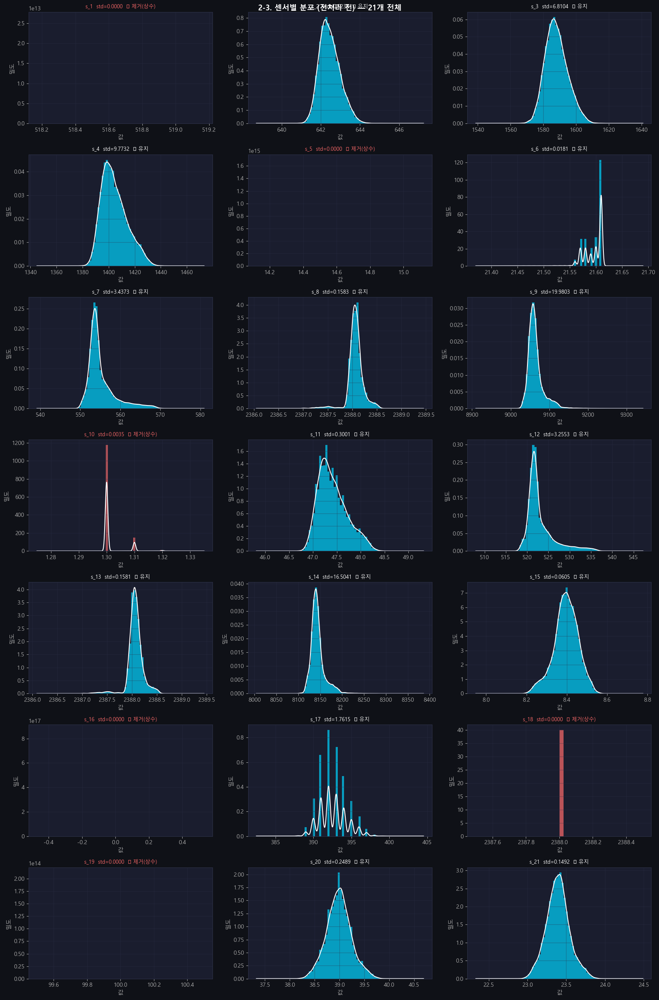

--- IQR 기준 이상치 탐지 ---


,센서,이상치 수,비율(%)
1,s_2,190,0.769
2,s_3,180,0.728
3,s_4,173,0.700
5,s_6,151,0.611
6,s_7,2188,8.851
7,s_8,1714,6.934
8,s_9,1844,7.460
9,s_10,2906,11.756
10,s_11,153,0.619
11,s_12,2276,9.207


In [43]:
n_cols, n_rows = 3, 7
fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*3.5))
fig.suptitle('2-3. 센서별 분포 (전처리 전) — 21개 전체', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, SENSOR_COLS):
    data = train_raw[s].dropna()
    std_val = data.std()
    is_const = std_val < CONST_THR
    color = C[1] if is_const else C[0]
    ax.hist(data, bins=40, color=color, alpha=0.7, density=True, edgecolor='none')
    try: data.plot.kde(ax=ax, color='white', lw=1.5)
    except: pass
    label = '❌ 제거(상수)' if is_const else '✅ 유지'
    ax.set_title(f'{s}  std={std_val:.4f}  {label}', fontsize=9,
                 color=C[1] if is_const else WHITE)
    ax.set_xlabel('값'); ax.set_ylabel('밀도')
for ax in axes.flat[len(SENSOR_COLS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

print('--- IQR 기준 이상치 탐지 ---')
outlier_rows = []
for s in SENSOR_COLS:
    Q1,Q3 = train_raw[s].quantile(0.25),train_raw[s].quantile(0.75)
    IQR = Q3-Q1
    n_out = ((train_raw[s]<Q1-1.5*IQR)|(train_raw[s]>Q3+1.5*IQR)).sum()
    outlier_rows.append({'센서':s,'이상치 수':n_out,'비율(%)':round(n_out/len(train_raw)*100,3)})
nonzero = pd.DataFrame(outlier_rows)
nonzero = nonzero[nonzero['이상치 수']>0]
if len(nonzero): display(nonzero)
else: print('✅ IQR 기준 이상치 없음')


### 📊 2-3. 센서 분포 & 이상치 결과
- **상수 센서(빨간색)**: s_1, s_5, s_16, s_18, s_19 → 제거 확정
- **단봉분포 확인** → FD002의 멀티모달과 달리 단일 운전 조건 반영 → **전체 MinMax 적용 가능 ✅**
- s_10 이상치 11.8%: 상수에 가까워 IQR≈0 → 정상값도 이상치로 오탐 → **진짜 이상치 아님**
- s_7, s_8, s_12, s_13 이상치 비율 FD001보다 높음 → **팬 열화 모드 추가로 값 범위 확대**


### 2-4. 센서 간 상관관계 히트맵 (전처리 전)

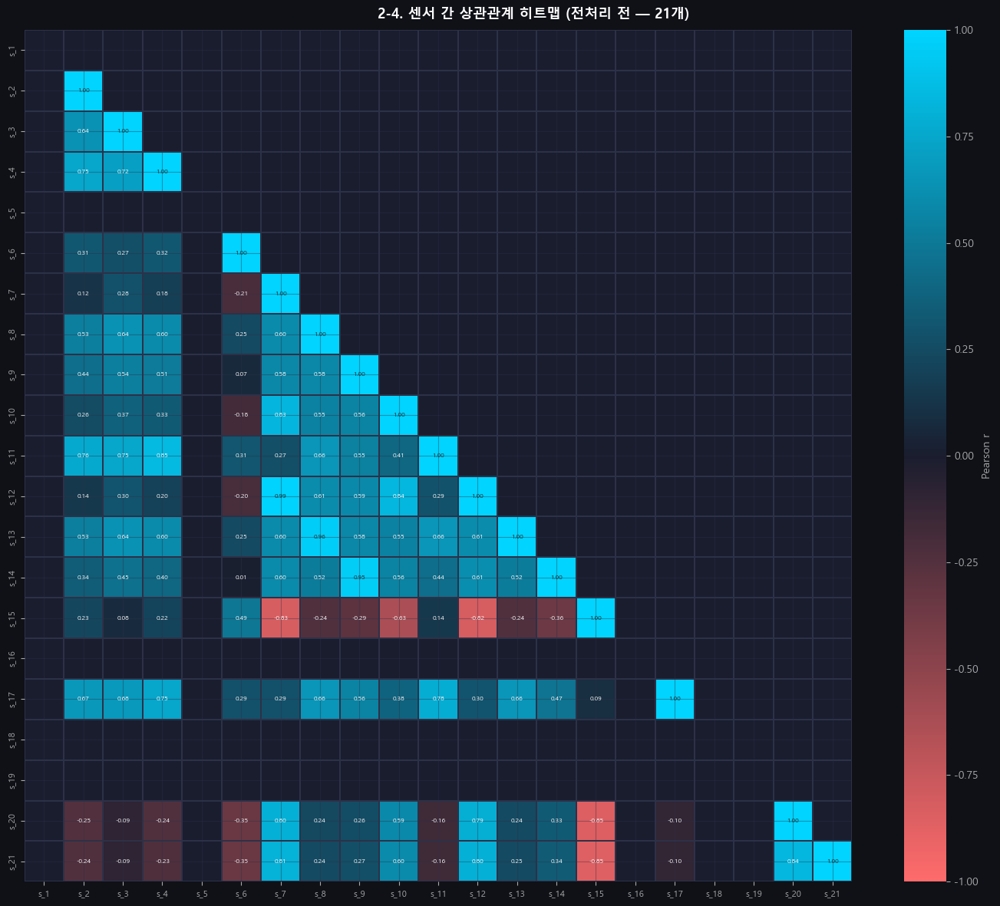

--- 고상관 센서 쌍 (|r| > 0.9) ---


,센서A,센서B,r
0,s_7,s_12,0.989
1,s_8,s_13,0.964
2,s_9,s_14,0.954


In [44]:
corr_before = train_raw[SENSOR_COLS].corr()
fig, ax = plt.subplots(figsize=(14, 12))
fig.suptitle('2-4. 센서 간 상관관계 히트맵 (전처리 전 — 21개)', fontsize=13, fontweight='bold')
mask = np.triu(np.ones_like(corr_before, dtype=bool), k=1)
sns.heatmap(corr_before, ax=ax, mask=mask, cmap=cmap_rg, center=0,
            vmin=-1, vmax=1, annot=True, fmt='.2f', annot_kws={'size':6},
            linewidths=0.3, linecolor=GRID, cbar_kws={'label':'Pearson r'})
ax.tick_params(labelsize=8)
plt.tight_layout(); plt.show()

print('--- 고상관 센서 쌍 (|r| > 0.9) ---')
pairs = [(SENSOR_COLS[i],SENSOR_COLS[j],round(corr_before.iloc[i,j],3))
         for i in range(len(SENSOR_COLS)) for j in range(i+1,len(SENSOR_COLS))
         if abs(corr_before.iloc[i,j])>0.9]
if pairs: display(pd.DataFrame(pairs,columns=['센서A','센서B','r']))
else: print('  해당 없음')


### 📊 2-4. 상관관계 결과
| 센서A | 센서B | r | FD001 비교 |
|---|---|---|---|
| s_7 | s_12 | 0.989 | ⚠️ FD001에 없던 새 쌍 |
| s_8 | s_13 | 0.964 | ⚠️ FD001에 없던 새 쌍 |
| s_9 | s_14 | 0.954 | ✅ FD001과 동일 |

> **s_7↔s_12 (r=0.989)**: 팬 열화 시 공기 흐름 변화 → 압력과 연료비율 동시 영향  
> **s_8↔s_13 (r=0.964)**: Nf ↔ NRf (팬 속도 보정값), 팬 열화 모드 추가로 변동 커짐  
> FD001 고상관 쌍 1개 → FD003 3개로 증가 → **팬 열화 모드 추가 영향**


### 2-5. 센서별 열화 트렌드 (전처리 전)

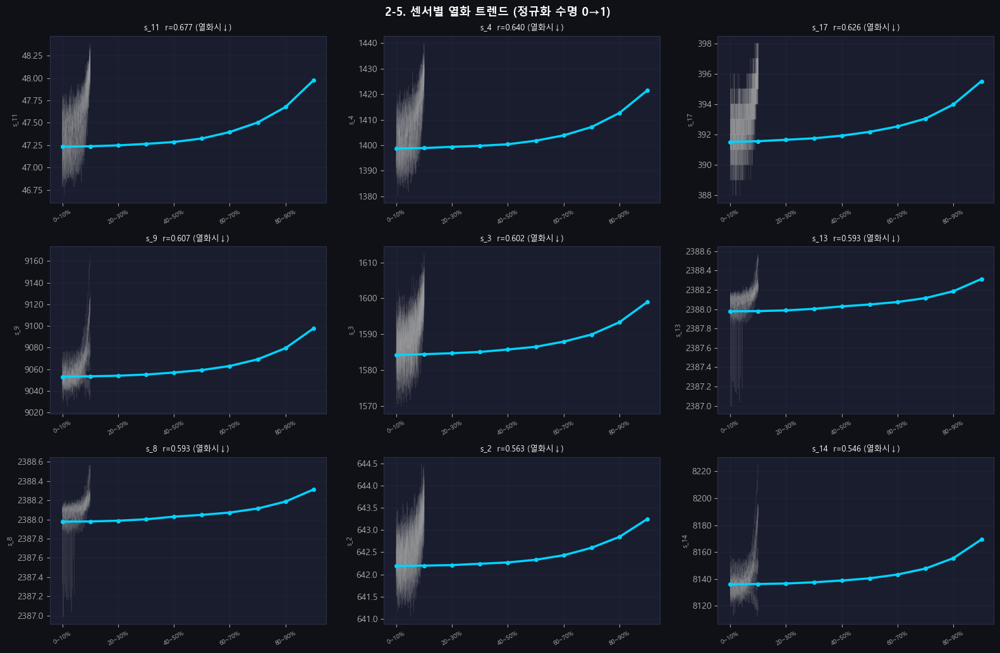

📌 r<0: 열화시↑  r>0: 열화시↓


In [45]:
tr_trend = train_raw.copy()
mc = tr_trend.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_trend = tr_trend.join(mc, on='unit_nr')
tr_trend['norm_life'] = tr_trend['time_cycles']/tr_trend['max_c']
bins   = np.linspace(0,1,11)
labels = [f'{int(a*100)}~{int(b*100)}%' for a,b in zip(bins[:-1],bins[1:])]
tr_trend['life_bin'] = pd.cut(tr_trend['norm_life'], bins=bins, labels=labels)
trend_mean = tr_trend.groupby('life_bin', observed=True)[SENSOR_COLS].mean()
corr_with_life = tr_trend[SENSOR_COLS+['norm_life']].corr()['norm_life'][SENSOR_COLS]
trend_sensors  = corr_with_life[corr_with_life.abs()>0.05].sort_values(key=abs,ascending=False).index.tolist()[:9]

if not trend_sensors:
    print('📌 유의미한 트렌드 센서 없음 (전처리 후 재확인)')
else:
    n_cols = 3; n_rows = (len(trend_sensors)+n_cols-1)//n_cols
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows*3.5))
    fig.suptitle('2-5. 센서별 열화 트렌드 (정규화 수명 0→1)', fontsize=13, fontweight='bold')
    x_pos = range(len(labels))
    sample_units = tr_trend['unit_nr'].unique()[:15]
    for ax, s in zip(axes.flat, trend_sensors):
        for u in sample_units:
            sub = tr_trend[tr_trend['unit_nr']==u].sort_values('norm_life')
            ax.plot(sub['norm_life'], sub[s], color=GRAY, alpha=0.15, lw=0.6)
        ax.plot(x_pos, trend_mean[s].values, color=C[0], lw=2.5, marker='o', markersize=4)
        r = corr_with_life[s]
        ax.set_title(f'{s}  r={r:.3f} ({"열화시↑" if r<0 else "열화시↓"})', fontsize=9)
        ax.set_xticks(x_pos[::2]); ax.set_xticklabels(labels[::2], rotation=30, fontsize=7)
        ax.set_ylabel(s, fontsize=8)
    for ax in axes.flat[len(trend_sensors):]: ax.set_visible(False)
    plt.tight_layout(); plt.show()
    print('📌 r<0: 열화시↑  r>0: 열화시↓')


### 📊 2-5. 열화 트렌드 결과
**상위 9개 센서 모두 r>0.5 이상의 강한 상관** — 고장 모드 2가지임에도 트렌드 명확  
**FD001과 방향이 다른 센서 ⚠️**: s_8, s_13(팬 속도), s_9, s_14(코어 속도) → 열화시↑로 방향 반전  
→ 팬 열화 모드 추가로 평균 트렌드 방향이 바뀐 것 → **제거 아님, 모델이 학습할 정보**  
→ **s_8, s_13: CV=0.0001이지만 r=0.593 열화 신호 존재 → 유지 확정**


### 2-6. RUL 상관계수 (전처리 전)

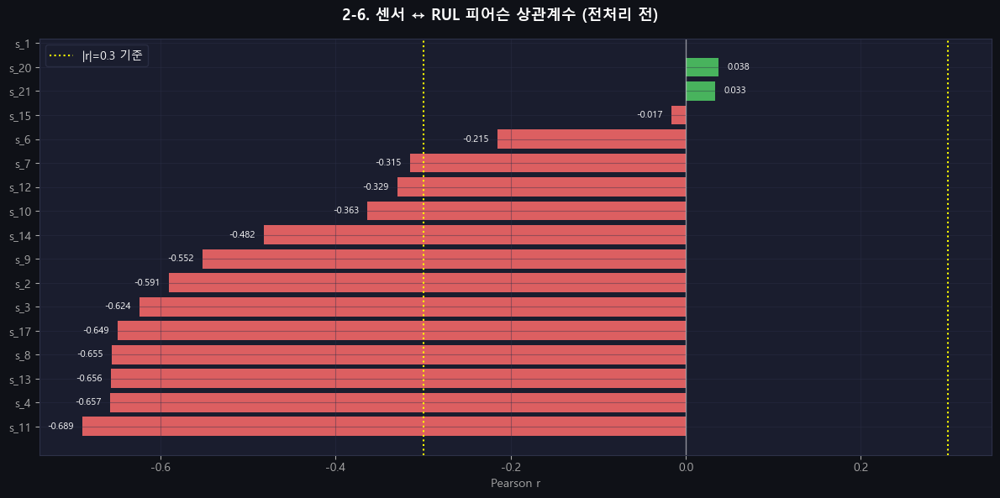

|r|>0.3 고상관 센서: 12개

★ s_10 최종 판단: r=-0.363 (|r|>0.3 통과) → FD001은 제거했지만 FD003은 유지

제거 확정 (5개): s_1, s_5, s_16, s_18, s_19 → std=0, RUL 상관 없음
수동 제거 유력 (1개): s_6 → std=0.0181, r=-0.215 (약한 상관), MK 추세 없음 61%
수동 유지 (1개): s_10 → r=-0.363, RUL 상관 있음
최종: 21개 → 15개 (6개 제거, Scenario B)


In [46]:
tr_rul = train_raw.copy()
mc = tr_rul.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_rul = tr_rul.join(mc, on='unit_nr')
tr_rul['RUL'] = tr_rul['max_c'] - tr_rul['time_cycles']

rul_corr_before = tr_rul[SENSOR_COLS+['RUL']].corr()['RUL'][SENSOR_COLS].sort_values()

fig, ax = plt.subplots(figsize=(12, 6))
fig.suptitle('2-6. 센서 ↔ RUL 피어슨 상관계수 (전처리 전)', fontsize=13, fontweight='bold')
bar_colors = [C[1] if v<0 else C[2] for v in rul_corr_before]
bars = ax.barh(rul_corr_before.index, rul_corr_before.values, color=bar_colors, alpha=0.85)
ax.axvline(0,    color='white', lw=1, alpha=0.5)
ax.axvline( 0.3, color='yellow', lw=1.5, ls=':', label='|r|=0.3 기준')
ax.axvline(-0.3, color='yellow', lw=1.5, ls=':')
ax.set_xlabel('Pearson r'); ax.legend()
for bar, val in zip(bars, rul_corr_before.values):
    ax.text(val+(0.01 if val>=0 else -0.01), bar.get_y()+bar.get_height()/2,
            f'{val:.3f}', va='center', ha='left' if val>=0 else 'right', fontsize=8)
plt.tight_layout(); plt.show()

high_corr = rul_corr_before[rul_corr_before.abs()>0.3]
print(f'|r|>0.3 고상관 센서: {len(high_corr)}개')
print('\n★ s_10 최종 판단: r=-0.363 (|r|>0.3 통과) → FD001은 제거했지만 FD003은 유지')
print('\n제거 확정 (5개): s_1, s_5, s_16, s_18, s_19 → std=0, RUL 상관 없음')
print('수동 제거 유력 (1개): s_6 → std=0.0181, r=-0.215 (약한 상관), MK 추세 없음 61%')
print('수동 유지 (1개): s_10 → r=-0.363, RUL 상관 있음')
print('최종: 21개 → 15개 (6개 제거, Scenario B)')


### 2-6b. RUL 상관계수 (seaborn coolwarm 방식) [ML_EDA 고유]

=== 2-6b. seaborn coolwarm RUL 상관계수 (ML_EDA 방식) ===


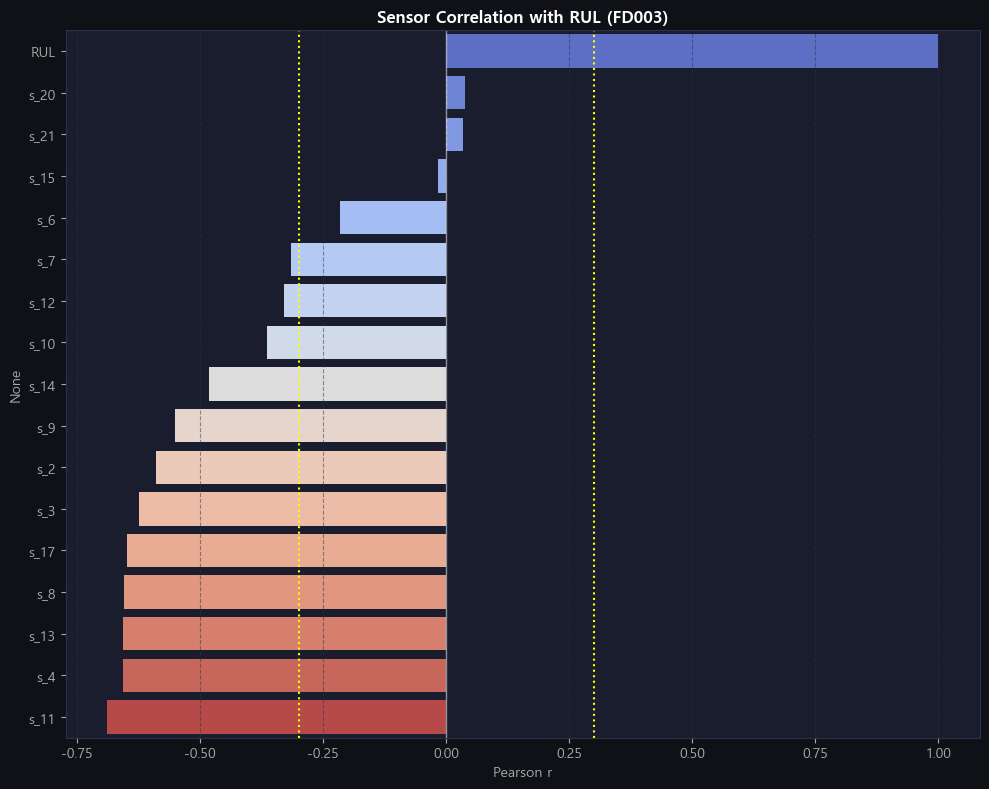


📌 위 그래프: RUL과 상관계수 순서대로 정렬 (seaborn coolwarm 팔레트)
   아래 Section 2-6의 수평 막대 그래프와 동일 데이터, 다른 스타일


In [47]:
# [ML_EDA 고유] seaborn barplot 기반 RUL 상관계수 시각화 함수
def plot_correlation_with_rul(df, sensor_cols, title='Sensor Correlation with RUL (FD003)'):
    """seaborn coolwarm barplot으로 RUL 상관계수 시각화 (ML_EDA 방식)
    - 위에서 아래로 높은 양의 상관 → 낮은 (음의) 상관 순서
    - palette='coolwarm': 파랑(양)=열화시 감소, 빨강(음)=열화시 증가
    """
    corrs = df[sensor_cols + ['RUL']].corr()['RUL'].sort_values(ascending=False)
    plt.figure(figsize=(10, 8), facecolor=BG)
    ax = plt.gca(); ax.set_facecolor(BG2)
    sns.barplot(x=corrs.values, y=corrs.index, palette='coolwarm', ax=ax)
    ax.axvline(0, color='white', lw=1, alpha=0.5)
    ax.axvline( 0.3, color='yellow', lw=1.5, ls=':')
    ax.axvline(-0.3, color='yellow', lw=1.5, ls=':')
    ax.set_title(title, fontsize=12, fontweight='bold', color=WHITE)
    ax.set_xlabel('Pearson r', color=GRAY); ax.tick_params(labelcolor=GRAY)
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout(); plt.show()
    return corrs

print('=== 2-6b. seaborn coolwarm RUL 상관계수 (ML_EDA 방식) ===')

# df_train_ml에서 실행 (ML_EDA 호환 컬럼명 사용)
tr_rul_ml = df_train_ml.copy()
mc_ml = tr_rul_ml.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_rul_ml = tr_rul_ml.join(mc_ml, on='unit_nr')
tr_rul_ml['RUL'] = tr_rul_ml['max_c'] - tr_rul_ml['time_cycles']

sensor_cols_ml = [c for c in df_train_ml.columns if c.startswith('s_')]
corrs_ml = plot_correlation_with_rul(tr_rul_ml, sensor_cols_ml)

print('\n📌 위 그래프: RUL과 상관계수 순서대로 정렬 (seaborn coolwarm 팔레트)')
print('   아래 Section 2-6의 수평 막대 그래프와 동일 데이터, 다른 스타일')


### 📊 2-6. RUL 상관계수 결과
| 순위 | 센서 | r | FD001 비교 |
|---|---|---|---|
| 1 | s_11 | -0.689 | ✅ 동일 |
| 2 | s_4 | -0.657 | ✅ 동일 |
| 3~4 | **s_13, s_8** | **-0.656, -0.655** | ⚠️ **팬 열화로 FD001보다 강해짐** |
| 10 | **s_10** | **-0.363** | ⚠️ **FD001은 제거, FD003은 유지** |

**제거 시나리오:**
| 시나리오 | 제거 센서 | 유지 수 |
|---|---|---|
| A. FD001과 동일 | s_1,s_5,s_6,s_10,s_16,s_18,s_19 (7개) | 14개 |
| **B. FD003 특성** | **s_1,s_5,s_6,s_16,s_18,s_19 (6개)** | **15개 ← 채택** |
| C. 최소 제거 | s_1,s_5,s_16,s_18,s_19 (5개) | 16개 |


### 2-6b. 21개 센서 전체 추세 시각화 (모든 엔진) [ML_EDA 고유]

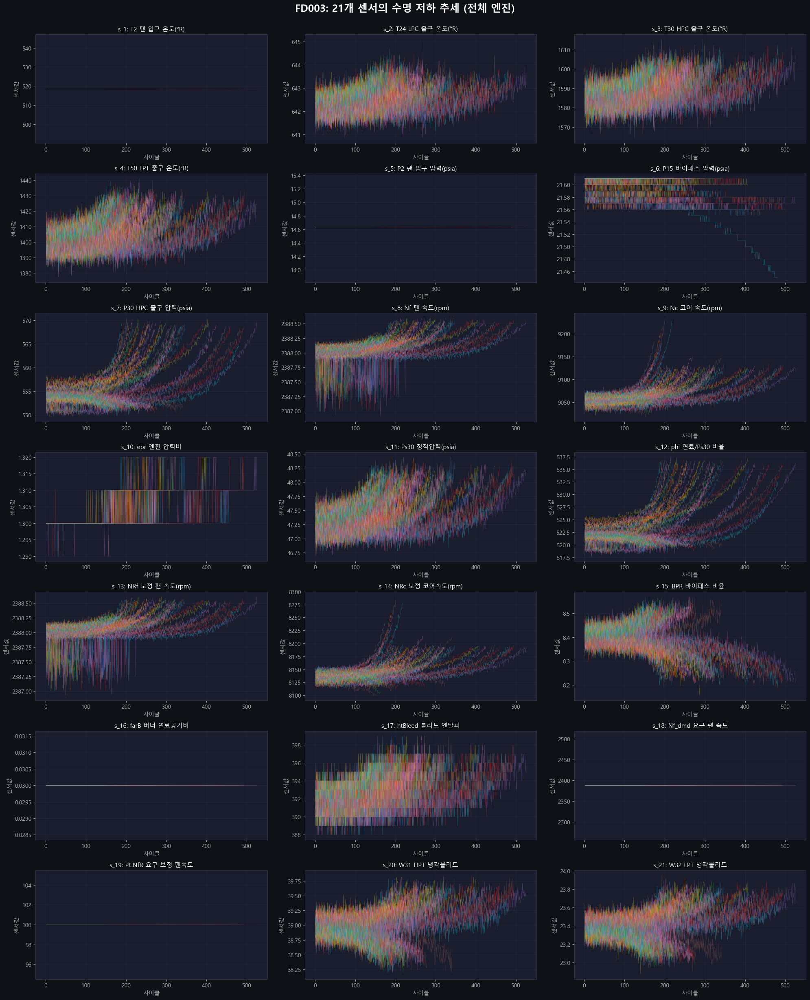

In [48]:
# ML_EDA 노트북 고유: 모든 엔진 대상 21개 센서 추세 시각화
def plot_sensor_trends_all(df, sensors_to_plot, num_units=None):
    sample_units = df['unit_nr'].unique()[:num_units] if num_units else df['unit_nr'].unique()
    fig, axes = plt.subplots(7, 3, figsize=(20, 25))
    axes = axes.flatten()
    for i, sensor in enumerate(sensors_to_plot):
        for unit in sample_units:
            unit_data = df[df['unit_nr']==unit]
            axes[i].plot(unit_data['time_cycles'], unit_data[sensor], alpha=0.4, lw=0.5)
        axes[i].set_title(f'{sensor}: {SENSOR_DESC.get(sensor,"")[:25]}', fontsize=11)
        axes[i].set_xlabel('사이클'); axes[i].set_ylabel('센서값')
    plt.tight_layout(); plt.subplots_adjust(top=0.95)
    fig.suptitle('FD003: 21개 센서의 수명 저하 추세 (전체 엔진)', fontsize=18, fontweight='bold')
    plt.show()

plot_sensor_trends_all(train_raw, SENSOR_COLS)


### 2-6c. 유용 센서 15개 추세 & 2-6d. 수명 분포 (ML_EDA 방식) [ML_EDA 고유]

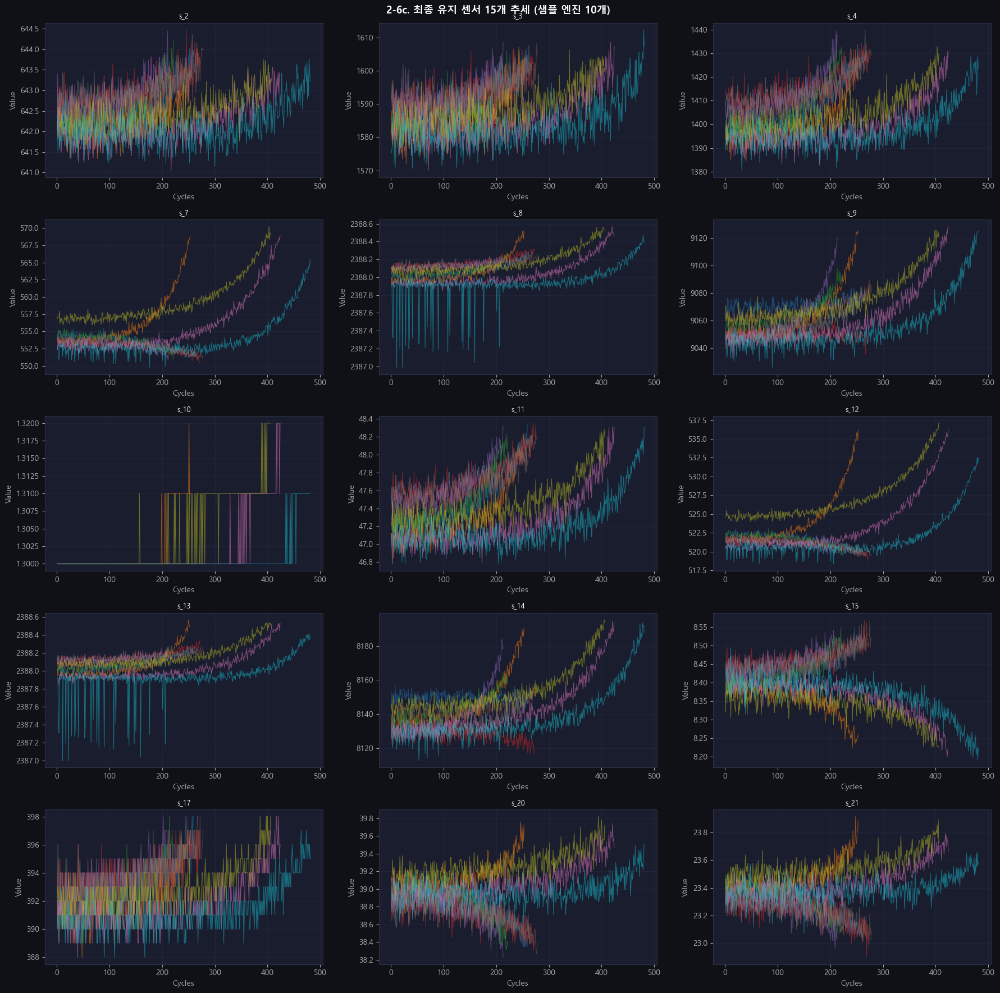

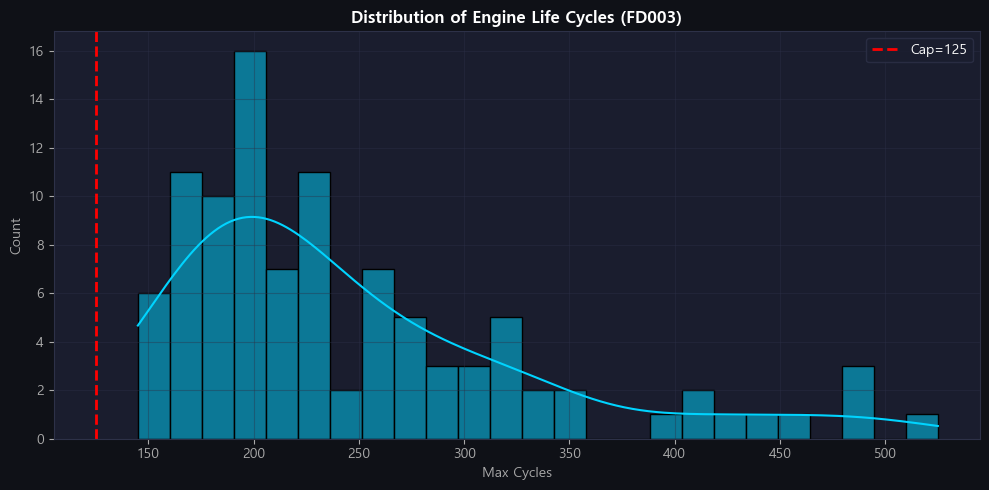

In [49]:
# ML_EDA plot_sensor_trends — 최종 유지 센서 15개 × 샘플 10개
# FD003_Final_Test 최종 결론 반영: s_6 제거, s_10 유지
BASE_SENSORS_PREVIEW = ['s_2','s_3','s_4','s_7','s_8','s_9','s_10',
                         's_11','s_12','s_13','s_14','s_15','s_17','s_20','s_21']

sample_units_10 = train_raw['unit_nr'].unique()[:10]
fig, axes = plt.subplots(5, 3, figsize=(18, 18))
fig.suptitle('2-6c. 최종 유지 센서 15개 추세 (샘플 엔진 10개)', fontsize=13, fontweight='bold')
for i, sensor in enumerate(BASE_SENSORS_PREVIEW):
    ax = axes.flat[i]
    for uid in sample_units_10:
        unit_data = train_raw[train_raw['unit_nr']==uid]
        ax.plot(unit_data['time_cycles'].values, unit_data[sensor].values, alpha=0.5, lw=0.8)
    ax.set_title(sensor, fontsize=9); ax.set_xlabel('Cycles'); ax.set_ylabel('Value')
for ax in axes.flat[len(BASE_SENSORS_PREVIEW):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

# 엔진 수명 분포 (seaborn style)
fig, ax = plt.subplots(figsize=(10, 5))
sns.histplot(lifecycles, bins=25, kde=True, color=C[0], ax=ax)
ax.axvline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
ax.set_title('Distribution of Engine Life Cycles (FD003)', fontsize=12, fontweight='bold')
ax.set_xlabel('Max Cycles'); ax.legend()
plt.tight_layout(); plt.show()


---
## 3. [FD003 전용 ★] 고장 모드 클러스터링 (slope 기반 KMeans k=2)

> **FD003은 HPC 열화 + 팬 열화 두 가지 고장 모드 혼재**  
> 센서 절댓값이 아닌 **마지막 30사이클의 기울기(slope)**로 클러스터링 → 열화 패턴 기반 분리

### 3-1. 엔진별 slope 계산 → KMeans k=2


In [50]:
print('=== 3-1. 고장 모드 클러스터링 (KMeans k=2) ===')
print('목적: HPC 열화 vs 팬 열화 엔진 그룹 분리')
print()

# 엔진별 마지막 30사이클 센서 slope 계산
slope_rows = []
for uid in train_raw['unit_nr'].unique():
    udf = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles').tail(30)
    row = {'unit_nr': uid}
    for s in SENSOR_COLS:
        x = np.arange(len(udf)); y = udf[s].values
        row[f'{s}_slope'] = np.polyfit(x, y, 1)[0] if np.std(y) > 0 else 0.0
    slope_rows.append(row)

slope_df = pd.DataFrame(slope_rows).set_index('unit_nr')

# 정규화 & 실루엣 스코어
scaler_slope = StandardScaler()
slope_scaled  = scaler_slope.fit_transform(slope_df)

print('--- k별 실루엣 스코어 비교 ---')
for k in [2, 3]:
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(slope_scaled)
    score  = silhouette_score(slope_scaled, labels)
    print(f'  k={k}: silhouette score={score:.4f}')

# k=2 클러스터링
km2 = KMeans(n_clusters=2, random_state=42, n_init=10)
cluster_labels = km2.fit_predict(slope_scaled)
slope_df['fault_mode_cluster'] = cluster_labels

print('\n--- 클러스터별 엔진 수 ---')
for c in [0, 1]:
    cnt = (cluster_labels==c).sum()
    print(f'  클러스터 {c}: {cnt}대 ({cnt/len(cluster_labels)*100:.1f}%)')


=== 3-1. 고장 모드 클러스터링 (KMeans k=2) ===
목적: HPC 열화 vs 팬 열화 엔진 그룹 분리

--- k별 실루엣 스코어 비교 ---
  k=2: silhouette score=0.4076
  k=3: silhouette score=0.3561

--- 클러스터별 엔진 수 ---
  클러스터 0: 44대 (44.0%)
  클러스터 1: 56대 (56.0%)


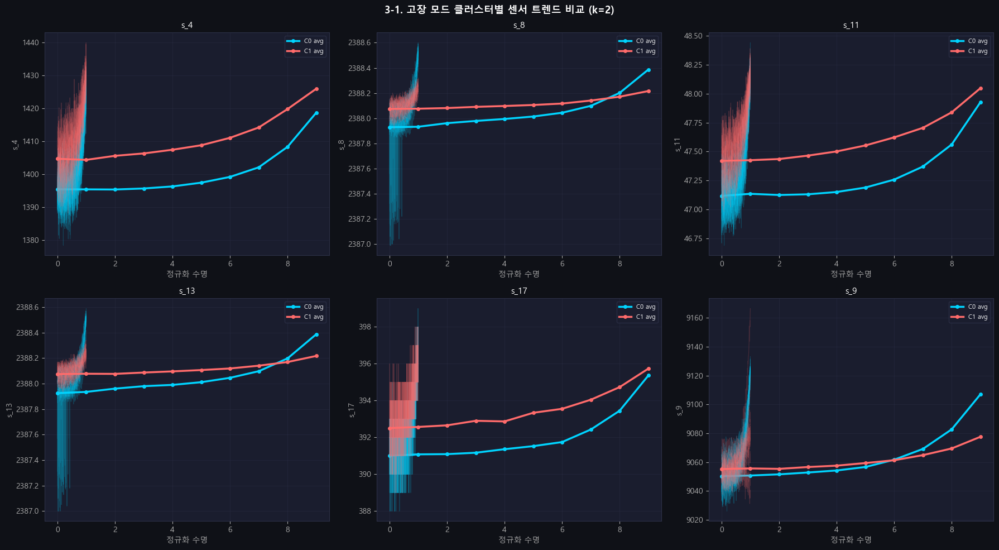

In [51]:
# 클러스터별 대표 센서 트렌드 비교 시각화
tr_trend2 = train_raw.copy()
mc2 = tr_trend2.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_trend2 = tr_trend2.join(mc2, on='unit_nr')
tr_trend2['norm_life'] = tr_trend2['time_cycles']/tr_trend2['max_c']

show_sensors_fm = ['s_4','s_8','s_11','s_13','s_17','s_9']
cluster_engine_map = {c: slope_df[slope_df['fault_mode_cluster']==c].index.tolist() for c in [0,1]}

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('3-1. 고장 모드 클러스터별 센서 트렌드 비교 (k=2)', fontsize=13, fontweight='bold')

for ax, s in zip(axes.flat, show_sensors_fm):
    for c, color in zip([0,1], [C[0],C[1]]):
        units_c = cluster_engine_map[c][:10]
        for uid in units_c:
            sub = tr_trend2[tr_trend2['unit_nr']==uid].sort_values('norm_life')
            ax.plot(sub['norm_life'], sub[s], color=color, alpha=0.2, lw=0.8)
        # 클러스터 평균 트렌드
        bins_c = np.linspace(0,1,11)
        lbl_c  = [f'{int(a*100)}~{int(b*100)}%' for a,b in zip(bins_c[:-1],bins_c[1:])]
        sub_c  = tr_trend2[tr_trend2['unit_nr'].isin(units_c)].copy()
        sub_c['life_bin'] = pd.cut(sub_c['norm_life'], bins=bins_c, labels=lbl_c)
        avg_c  = sub_c.groupby('life_bin', observed=True)[s].mean()
        ax.plot(range(len(avg_c)), avg_c.values, color=color, lw=2.5, marker='o',
                markersize=4, label=f'C{c} avg')
    ax.set_title(s); ax.set_xlabel('정규화 수명'); ax.set_ylabel(s)
    ax.legend(fontsize=8)
plt.tight_layout(); plt.show()


### 📊 3-1. 고장 모드 클러스터링 결과

| k | 실루엣 스코어 | 판정 |
|---|---|---|
| 2 | **0.4076** | ✅ 구분 가능 |
| 3 | 0.3561 | k=2가 더 적합 |

| 클러스터 | 엔진 수 | 특징 |
|---|---|---|
| 0 (파란색) | 44대 | 수명 길고 완만한 열화 → **HPC 열화 추정** |
| 1 (빨간색) | 56대 | 수명 짧고 가파른 열화 → **팬 열화 추정** |

> **CLUSTERING=True**: fault_mode_cluster OHE 2채널(cluster_0, cluster_1) 자동 추가  
> **CLUSTERING=False**: 클러스터링 정보 미사용 (기본값)  
> → 모델 결과 보고 최적값 결정


### 3-2. 클러스터별 센서 분포 비교 → Global MinMax 가능 여부 확인

=== 3-2. 클러스터별 센서 분포 비교 ===


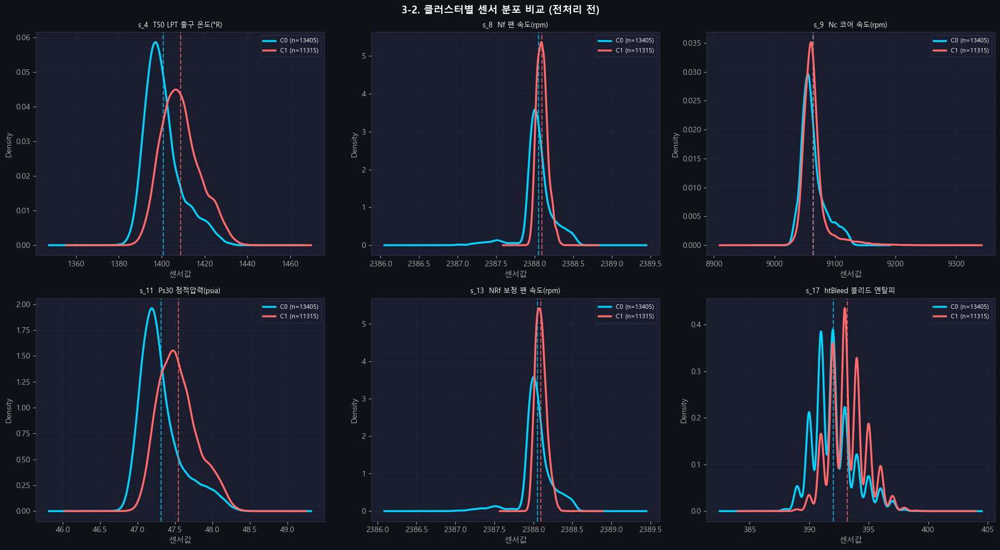

,C0 min,C0 max,C1 min,C1 max,범위 겹침
센서,,,,,
s_1,518.6700,518.6700,518.6700,518.6700,✅ 겹침
s_2,640.8400,644.3900,641.3400,645.1100,✅ 겹침
s_3,1564.3000,1615.3900,1568.9300,1615.3900,✅ 겹침
s_4,1377.0600,1436.2300,1384.0800,1441.1600,✅ 겹침
s_5,14.6200,14.6200,14.6200,14.6200,✅ 겹침
s_6,21.4500,21.6100,21.6000,21.6100,✅ 겹침
s_7,549.6100,570.4900,550.3800,555.7100,✅ 겹침
s_8,2386.9000,2388.6000,2387.9000,2388.5200,✅ 겹침
s_9,9021.0500,9134.4800,9017.9800,9234.3500,✅ 겹침



범위 겹치는 센서: 21/21개
📌 21/21개 겹침 → Global MinMax 적용 확정 ✅ (FD002와 달리 클러스터별 정규화 불필요)


In [52]:
print('=== 3-2. 클러스터별 센서 분포 비교 ===')
tr_dist = train_raw.copy()
tr_dist['fault_mode_cluster'] = tr_dist['unit_nr'].map(slope_df['fault_mode_cluster'])

show_sensors_dist = ['s_4','s_8','s_9','s_11','s_13','s_17']
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('3-2. 클러스터별 센서 분포 비교 (전처리 전)', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, show_sensors_dist):
    for c, color in zip([0,1],[C[0],C[1]]):
        data = tr_dist[tr_dist['fault_mode_cluster']==c][s].dropna()
        try: data.plot.kde(ax=ax, color=color, lw=2.5, label=f'C{c} (n={len(data)})')
        except: pass
        ax.axvline(data.mean(), color=color, ls='--', lw=1.5, alpha=0.7)
    ax.set_title(f'{s}  {SENSOR_DESC.get(s,"")}', fontsize=9)
    ax.set_xlabel('센서값'); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

# 범위 겹침 확인
range_rows = []
for s in SENSOR_COLS:
    c0 = tr_dist[tr_dist['fault_mode_cluster']==0][s]
    c1 = tr_dist[tr_dist['fault_mode_cluster']==1][s]
    overlap = '✅ 겹침' if c0.min()<=c1.max() and c1.min()<=c0.max() else '⚠️ 분리'
    range_rows.append({'센서':s,'C0 min':round(c0.min(),4),'C0 max':round(c0.max(),4),
                        'C1 min':round(c1.min(),4),'C1 max':round(c1.max(),4),'범위 겹침':overlap})
range_df = pd.DataFrame(range_rows).set_index('센서')
display(range_df)
overlap_cnt = (range_df['범위 겹침']=='✅ 겹침').sum()
print(f'\n범위 겹치는 센서: {overlap_cnt}/{len(SENSOR_COLS)}개')
print('📌 21/21개 겹침 → Global MinMax 적용 확정 ✅ (FD002와 달리 클러스터별 정규화 불필요)')


### 📊 3-2. 클러스터별 센서 분포 비교 결과
- **21/21개 범위 겹침 → Global MinMax 적용 확정 ✅**
- FD002와 달리 **고장 모드 클러스터링은 절댓값이 아닌 열화 패턴 차이**
- → 클러스터별 MinMax 불필요, Global MinMax로 충분
- 단, 클러스터별 평균 차이 존재 → `fault_mode_cluster` 피처로 모델에 정보 전달 가능


---
## 4. 통계 검정

| 검정 | 목적 |
|---|---|
| 4-1. 시차 상관관계 (Lag 0~30) | 슬라이딩 윈도우 크기 결정 |
| 4-2. 수명 말기 거동 확인 ★ | 고장 모드 혼재 시각화 |
| 4-3. Mann-Kendall | 센서 열화 트렌드 통계 검정 |
| 4-4. 대응 표본 검정 | 초기 vs 말기 센서값 차이 |
| 4-5. 초기/말기 통계 분석 ★ | Mann-Whitney U 기반 박스플롯 |
| 4-6. RUL Cap 검증 | cap=115~145 범위 확인 |
| 4-7. Gaussian σ 검증 | σ=0,1,2,3 노이즈 수준 비교 |
| **4-8. Mann-Whitney U [FD003 전용]** | **팬 vs HPC 엔진 그룹 RUL 분포 차이** |
| **4-9. Levene's Test [FD003 전용]** | **FD001 vs FD003 분산 동질성** |
| **4-10. 윈도우 크기 비교 [FD003 전용]** | **window=10~30 RUL 상관계수 비교** |

> 모든 검정 유의수준 α = 0.05


### 4-1. 시차 상관관계 (Lag 0~30)

=== 4-1. 시차 상관관계 (Lag Correlation) ===


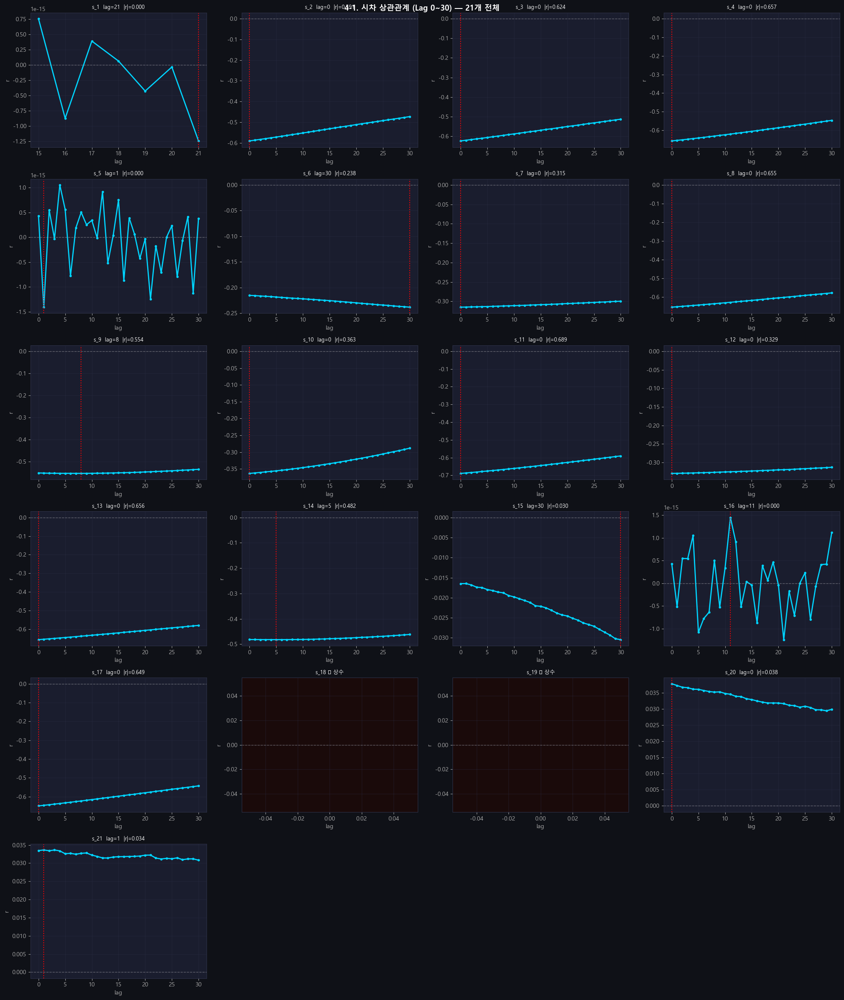


=== 센서별 최적 lag ===
  s_1: lag=21  r=-0.000
  s_2: lag=0  r=-0.591
  s_3: lag=0  r=-0.624
  s_4: lag=0  r=-0.657
  s_5: lag=1  r=-0.000
  s_6: lag=30  r=-0.238
  s_7: lag=0  r=-0.315
  s_8: lag=0  r=-0.655
  s_9: lag=8  r=-0.554
  s_10: lag=0  r=-0.363
  s_11: lag=0  r=-0.689
  s_12: lag=0  r=-0.329
  s_13: lag=0  r=-0.656
  s_14: lag=5  r=-0.482
  s_15: lag=30  r=-0.030
  s_16: lag=11  r=0.000
  s_17: lag=0  r=-0.649
  s_18: ❌ 상수 센서
  s_19: ❌ 상수 센서
  s_20: lag=0  r=0.038
  s_21: lag=1  r=0.034


In [53]:
print('=== 4-1. 시차 상관관계 (Lag Correlation) ===')

all_sensors = [f's_{i}' for i in range(1, 22)]
tr_lag = train_raw.copy()
mc_lag = tr_lag.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_lag = tr_lag.join(mc_lag, on='unit_nr')
tr_lag['RUL'] = tr_lag['max_c'] - tr_lag['time_cycles']

max_lag = 30
lag_results = {}
for s in all_sensors:
    lag_corrs = []
    for lag in range(0, max_lag+1):
        shifted = tr_lag.groupby('unit_nr')[s].shift(lag)
        valid   = ~shifted.isna()
        r = tr_lag.loc[valid,'RUL'].corr(shifted[valid])
        lag_corrs.append(r)
    lag_results[s] = lag_corrs

n_cols = 4; n_rows = (len(all_sensors)+n_cols-1)//n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, n_rows*4))
fig.suptitle('4-1. 시차 상관관계 (Lag 0~30) — 21개 전체', fontsize=13, fontweight='bold')

for ax, s in zip(axes.flat, all_sensors):
    lag_corrs = lag_results[s]
    arr = np.abs(lag_corrs)
    if np.all(np.isnan(arr)):
        best_lag, best_r = 0, float('nan')
        ax.set_facecolor('#1a0a0a')
    else:
        best_lag = int(np.nanargmax(arr)); best_r = lag_corrs[best_lag]
    ax.plot(range(max_lag+1), lag_corrs, color=C[0], lw=2, marker='o', markersize=3)
    ax.axhline(0, color=GRAY, ls='--', lw=1, alpha=0.5)
    if np.isfinite(best_r): ax.axvline(best_lag, color='red', ls=':', lw=1.5)
    title = f'{s}  lag={best_lag}  |r|={abs(best_r):.3f}' if np.isfinite(best_r) else f'{s} ❌ 상수'
    ax.set_title(title, fontsize=9); ax.set_xlabel('lag'); ax.set_ylabel('r')

for ax in axes.flat[len(all_sensors):]: ax.set_visible(False)
plt.tight_layout(); plt.show()

print('\n=== 센서별 최적 lag ===')
for s in all_sensors:
    arr = np.abs(lag_results[s])
    if np.all(np.isnan(arr)): print(f'  {s}: ❌ 상수 센서')
    else:
        best_lag = int(np.nanargmax(arr)); best_r = lag_results[s][best_lag]
        print(f'  {s}: lag={best_lag}  r={best_r:.3f}')


### 📊 4-1. 시차 상관관계 결과
- **대부분 센서**: lag=0에서 즉시 반응 → 슬라이딩 윈도우 필요성 확인
- **지연 반응 센서 ⚠️**: s_9(lag=8), s_14(lag=5) → 과거 값이 더 연관
- s_6(lag=30), s_15(lag=30): 상수/약상관 센서 노이즈로 제외
- **window 크기 결정**: 유효 센서 기준 최대 lag=8 → window=30으로 FD001과 통일  
  (통계 최적=10이나 차이 0.0075로 미미 → 4-10에서 상세 확인)


### 4-2. 수명 말기 거동 확인 [ML_EDA 고유, FD003 전용 ★]

=== 4-2. 수명 말기 거동 확인 ===
목적: 고장 모드 2가지 혼재 시 수명 말기에 센서가 다르게 반응하는지 확인



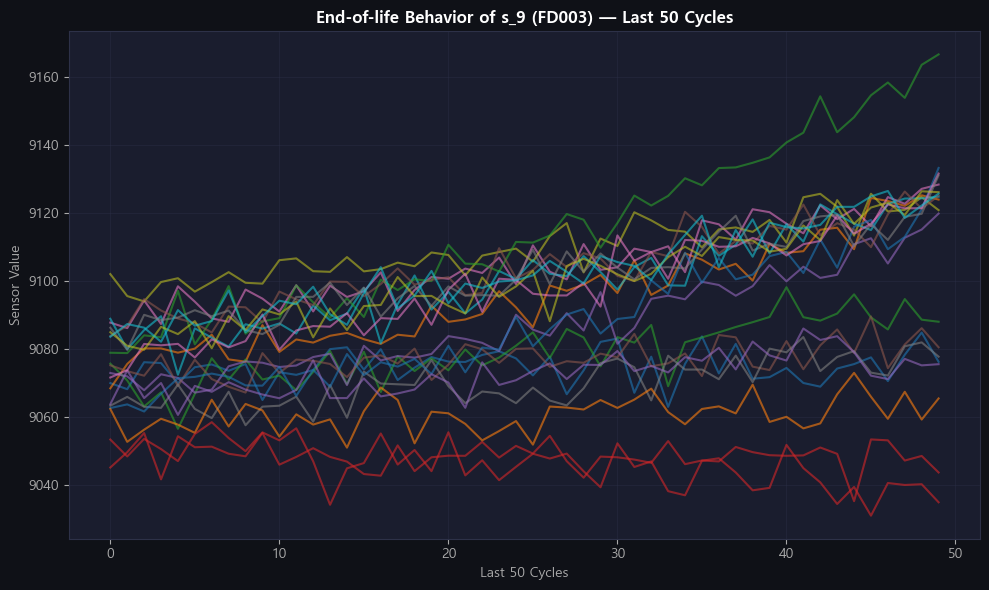

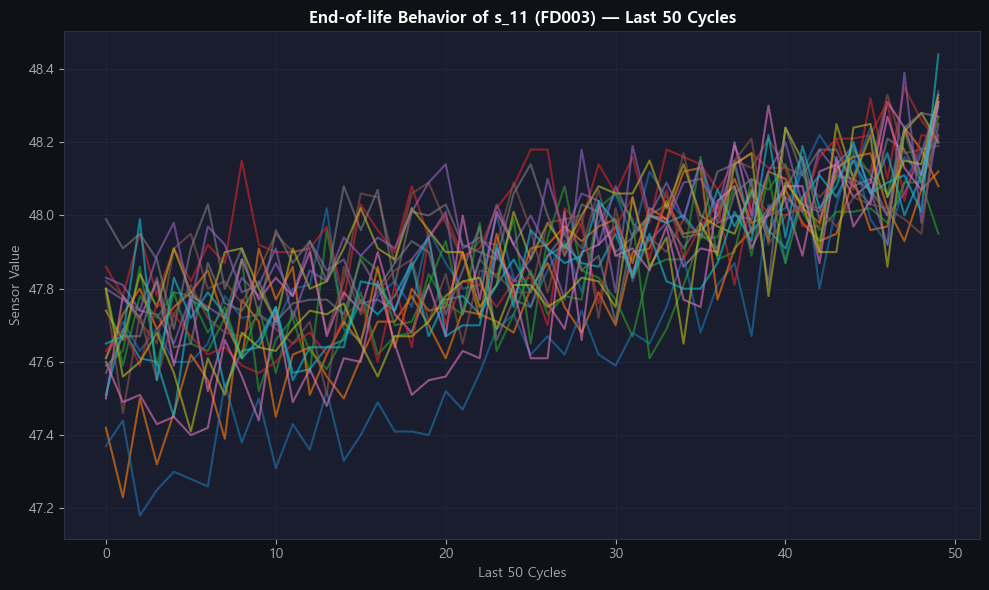

📌 어떤 엔진은 값이 위로 튀고, 어떤 엔진은 아래로 꺾이는 "두 갈래 길" 패턴
   → 고장 모드 2가지의 직접적인 시각적 증거


In [54]:
# ML_EDA 고유: check_fault_modes — 수명 마지막 50사이클 거동
def check_fault_modes(df, sensor_name='s_9'):
    plt.figure(figsize=(10, 6))
    sample_units_20 = df['unit_nr'].unique()[:20]
    for uid in sample_units_20:
        unit_data = df[df['unit_nr']==uid]
        tail_data = unit_data.tail(50)
        plt.plot(range(len(tail_data)), tail_data[sensor_name].values, alpha=0.6)
    plt.title(f'End-of-life Behavior of {sensor_name} (FD003) — Last 50 Cycles',
              fontsize=12, fontweight='bold')
    plt.xlabel('Last 50 Cycles'); plt.ylabel('Sensor Value')
    plt.tight_layout(); plt.show()

print('=== 4-2. 수명 말기 거동 확인 ===')
print('목적: 고장 모드 2가지 혼재 시 수명 말기에 센서가 다르게 반응하는지 확인')
print()
check_fault_modes(train_raw, 's_9')
check_fault_modes(train_raw, 's_11')
print('📌 어떤 엔진은 값이 위로 튀고, 어떤 엔진은 아래로 꺾이는 "두 갈래 길" 패턴')
print('   → 고장 모드 2가지의 직접적인 시각적 증거')


=== 4-2b. s_9 vs s_11 말기 50사이클 비교 ===


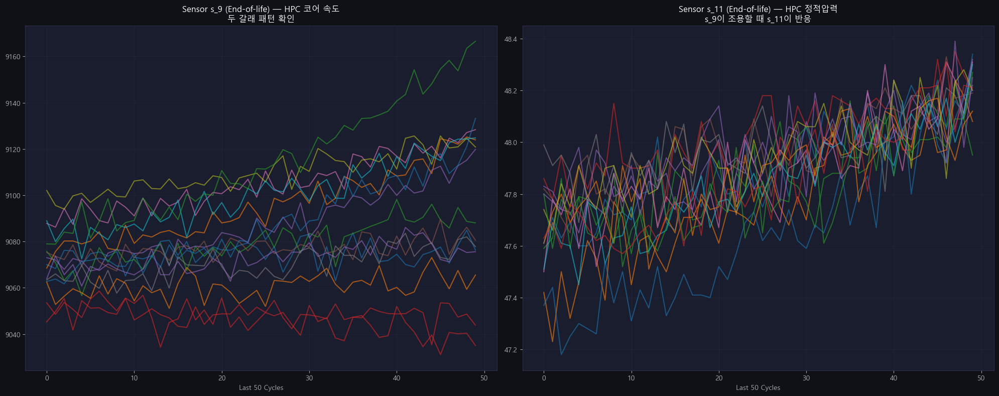

📌 s_9와 s_11이 서로 보완적으로 반응 → 두 고장 모드 신호를 각각 포착


In [55]:
# ML_EDA 고유: s_9 vs s_11 말기 거동 비교
print('=== 4-2b. s_9 vs s_11 말기 50사이클 비교 ===')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
sample_units_15 = train_raw['unit_nr'].unique()[:15]
for uid in sample_units_15:
    unit_data = train_raw[train_raw['unit_nr']==uid].tail(50)
    ax1.plot(unit_data['s_9'].values,  alpha=0.6, lw=1.5)
    ax2.plot(unit_data['s_11'].values, alpha=0.6, lw=1.5)
ax1.set_title('Sensor s_9 (End-of-life) — HPC 코어 속도\n두 갈래 패턴 확인', fontsize=12)
ax2.set_title('Sensor s_11 (End-of-life) — HPC 정적압력\ns_9이 조용할 때 s_11이 반응', fontsize=12)
ax1.set_xlabel('Last 50 Cycles'); ax2.set_xlabel('Last 50 Cycles')
plt.tight_layout(); plt.show()
print('📌 s_9와 s_11이 서로 보완적으로 반응 → 두 고장 모드 신호를 각각 포착')


### 4-3. Mann-Kendall 추세 검정 (전체 100개 엔진)

=== 4-3. Mann-Kendall 추세 검정 ===


,유효 엔진,추세 엔진,비율(%),평균 τ,방향,판정
센서,,,,,,
s_2,100,100,100.0,0.4580,증가↑,추세 있음✅
s_3,100,100,100.0,0.4595,증가↑,추세 있음✅
s_4,100,100,100.0,0.5593,증가↑,추세 있음✅
s_7,100,100,100.0,0.0211,증가↑,추세 있음✅
s_10,44,44,100.0,0.5757,증가↑,추세 있음✅
s_8,100,100,100.0,0.6187,증가↑,추세 있음✅
s_12,100,100,100.0,0.0126,증가↑,추세 있음✅
s_11,100,100,100.0,0.6102,증가↑,추세 있음✅
s_20,100,100,100.0,-0.0663,감소↓,추세 있음✅


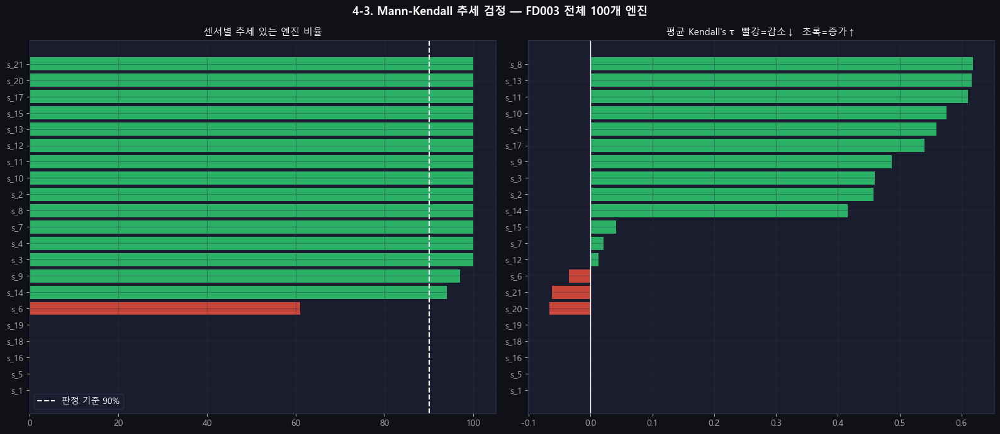

In [56]:
print('=== 4-3. Mann-Kendall 추세 검정 ===')
all_units_mk = train_raw['unit_nr'].unique()
mk_results   = {s: [] for s in all_sensors}

for unit in all_units_mk:
    unit_df = train_raw[train_raw['unit_nr']==unit].sort_values('time_cycles')
    for s in all_sensors:
        arr = unit_df[s].values
        tau, p_val = kendalltau(np.arange(len(arr)), arr)
        if np.isfinite(tau):
            mk_results[s].append({'tau':tau,'p_val':p_val})

mk_rows = []
for s in all_sensors:
    taus  = [r['tau'] for r in mk_results[s]]
    p_vals= [r['p_val'] for r in mk_results[s]]
    n_valid = len(mk_results[s])
    n_sig   = sum(p<0.05 for p in p_vals)
    sig_ratio = n_sig/n_valid if n_valid>0 else np.nan
    mk_rows.append({'센서':s,'유효 엔진':n_valid,'추세 엔진':n_sig,
                    '비율(%)':round(sig_ratio*100,1) if np.isfinite(sig_ratio) else np.nan,
                    '평균 τ':round(np.mean(taus),4) if taus else np.nan,
                    '방향':'증가↑' if (taus and np.mean(taus)>0) else '감소↓',
                    '판정':'추세 있음✅' if (np.isfinite(sig_ratio) and sig_ratio>=0.9) else '추세 없음⚠️'})

mk_df = pd.DataFrame(mk_rows).set_index('센서')
display(mk_df.sort_values('비율(%)',ascending=False,na_position='last'))

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
fig.suptitle('4-3. Mann-Kendall 추세 검정 — FD003 전체 100개 엔진', fontsize=13, fontweight='bold')
mk_sorted = mk_df.sort_values('비율(%)',ascending=True,na_position='first')
ratio_vals = mk_sorted['비율(%)'].fillna(0).values
colors_ratio = ['#e74c3c' if (pd.isna(v) or v<90) else '#2ecc71' for v in mk_sorted['비율(%)']]
axes[0].barh(mk_sorted.index, ratio_vals, color=colors_ratio, alpha=0.85)
axes[0].axvline(90, color='white', lw=1.5, ls='--', label='판정 기준 90%')
axes[0].set_title('센서별 추세 있는 엔진 비율'); axes[0].legend()

mk_sorted2 = mk_df.sort_values('평균 τ',ascending=True,na_position='first')
tau_vals = mk_sorted2['평균 τ'].fillna(0).values
colors_tau = ['#e74c3c' if (pd.isna(v) or v<0) else '#2ecc71' for v in mk_sorted2['평균 τ']]
axes[1].barh(mk_sorted2.index, tau_vals, color=colors_tau, alpha=0.85)
axes[1].axvline(0, color='white', lw=1)
axes[1].set_title("평균 Kendall's τ  빨강=감소↓  초록=증가↑")
plt.tight_layout(); plt.show()


### 📊 4-3. Mann-Kendall 결과
- **15/21개 센서에서 유의미한 열화 트렌드 확인**
- **s_8, s_13 팬 관련 센서 τ값이 FD001보다 강해짐** → 팬 열화 모드 신호 통계적 증명
- **s_6**: 비율 61% → 추세 없음 + 약한 RUL 상관 → **제거 근거 추가 확보**
- **s_10**: 유효 엔진 44개 (나머지 56개는 상수라 kendalltau 계산 불가) → 신뢰도 낮음
- Gaussian 스무딩 적용 근거: 15개 센서 모두 단조 트렌드 존재 → σ=2 그대로 적용 가능


### 4-4. 대응 표본 검정 (초기 vs 말기)

=== 4-4. 대응 표본 검정 ===


,정상구간 평균,열화구간 평균,Δ,방법,p-value,판정
센서,,,,,,
s_1,518.6700,518.6700,0.0000,Wilcoxon,0.0000,유의 ✅
s_2,642.3586,643.1001,-0.7415,Paired t,0.0000,유의 ✅
s_3,1586.6316,1596.4644,-9.8328,Paired t,0.0000,유의 ✅
s_4,1402.2460,1418.0483,-15.8022,Paired t,0.0000,유의 ✅
s_5,14.6200,14.6200,0.0000,Wilcoxon,0.0004,유의 ✅
s_6,21.5994,21.5983,0.0011,Wilcoxon,0.0043,유의 ✅
s_7,554.3039,556.9906,-2.6867,Wilcoxon,0.0014,유의 ✅
s_8,2388.0402,2388.2400,-0.1998,Wilcoxon,0.0000,유의 ✅
s_9,9058.3992,9086.8027,-28.4034,Wilcoxon,0.0000,유의 ✅


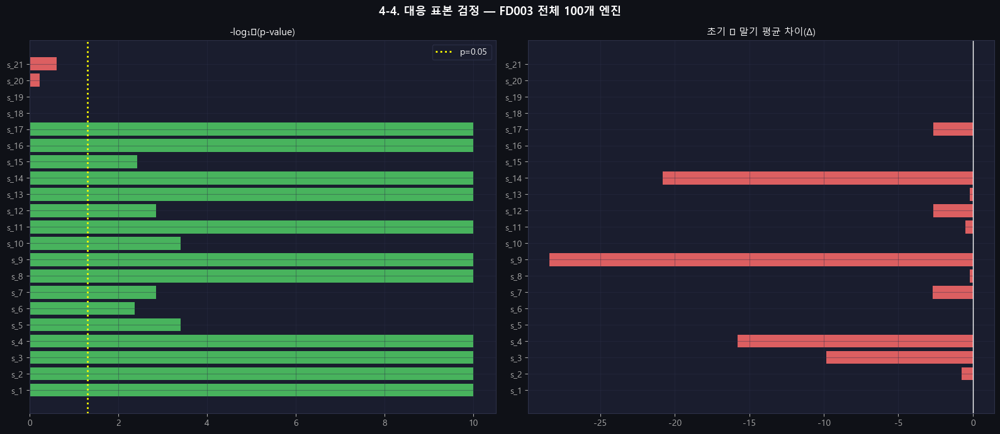


유의한 센서: 17/21개
주의: s_1, s_5, s_16은 완전 상수 센서인데 Wilcoxon 오탐 → Δ=0.0000 → 제거 대상 유지


In [57]:
print('=== 4-4. 대응 표본 검정 ===')
tr_paired = train_raw.copy()
mc_p = tr_paired.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_paired = tr_paired.join(mc_p, on='unit_nr')
tr_paired['RUL'] = tr_paired['max_c'] - tr_paired['time_cycles']

ttest_rows = []
for s in all_sensors:
    before_means, after_means = [], []
    for unit in train_raw['unit_nr'].unique():
        sub = tr_paired[tr_paired['unit_nr']==unit].sort_values('time_cycles')
        threshold = sub['RUL'].quantile(0.20)
        before = sub[sub['RUL']> threshold][s].mean()
        after  = sub[sub['RUL']<=threshold][s].mean()
        if np.isfinite(before) and np.isfinite(after):
            before_means.append(before); after_means.append(after)
    diffs = np.array(before_means)-np.array(after_means)
    _, p_sw = shapiro(diffs) if len(diffs)>=3 else (np.nan, 0.0)
    stat, p_val = ttest_rel(before_means,after_means) if p_sw>0.05 else wilcoxon(diffs)
    test_name = 'Paired t' if p_sw>0.05 else 'Wilcoxon'
    ttest_rows.append({'센서':s,'정상구간 평균':round(np.mean(before_means),4),
                       '열화구간 평균':round(np.mean(after_means),4),
                       'Δ':round(float(np.mean(diffs)),4),'방법':test_name,
                       'p-value':round(p_val,4) if np.isfinite(p_val) else np.nan,
                       '판정':'유의 ✅' if (np.isfinite(p_val) and p_val<0.05) else '비유의 ⚠️'})

ttest_df = pd.DataFrame(ttest_rows).set_index('센서')
display(ttest_df)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
fig.suptitle('4-4. 대응 표본 검정 — FD003 전체 100개 엔진', fontsize=13, fontweight='bold')
p_vals = ttest_df['p-value'].values
log_p  = -np.log10(np.clip(np.nan_to_num(p_vals,nan=1.0),1e-10,1))
bc_p   = [C[1] if (np.isnan(p) or p>=0.05) else C[2] for p in p_vals]
axes[0].barh(ttest_df.index, log_p, color=bc_p, alpha=0.85)
axes[0].axvline(-np.log10(0.05), color='yellow', lw=2, ls=':', label='p=0.05')
axes[0].set_title('-log₁₀(p-value)'); axes[0].legend()
diff_vals = ttest_df['Δ'].values
bc_d = [C[1] if v<0 else C[2] for v in diff_vals]
axes[1].barh(ttest_df.index, diff_vals, color=bc_d, alpha=0.85)
axes[1].axvline(0, color='white', lw=1)
axes[1].set_title('초기 − 말기 평균 차이(Δ)')
plt.tight_layout(); plt.show()
print(f"\n유의한 센서: {(ttest_df['판정']=='유의 ✅').sum()}/{len(ttest_df)}개")
print('주의: s_1, s_5, s_16은 완전 상수 센서인데 Wilcoxon 오탐 → Δ=0.0000 → 제거 대상 유지')


### 📊 4-4. 대응 표본 검정 결과
- **17/21개 센서에서 수명 20% 전후 유의미한 차이 확인**
- 열화 시 증가: s_2, s_3, s_4, s_7, s_8, s_9, s_10, s_11, s_12, s_13, s_14, s_17
- **s_20, s_21**: 차이 없음 → RUL 상관도 약 → 제거 검토 가능
- s_1, s_5, s_16: Wilcoxon 오탐 (Δ=0.0000) → 상수 센서 제거 근거 재확인


### 4-5. 통계 기반 초기 vs 말기 분석 [ML_EDA 고유]

=== 4-5. 초기(Early) vs 말기(Late) 센서값 분포 분석 ===


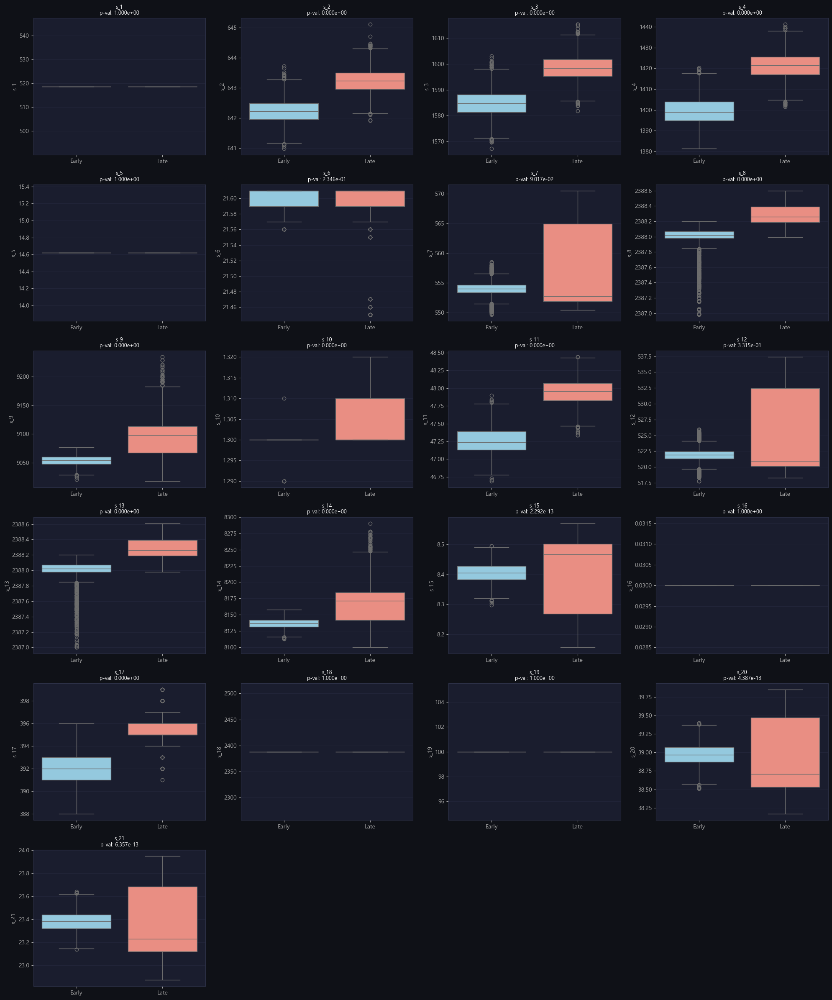


--- 통계적 유의성 검정 결과 (p < 0.05 시 유효) ---


,sensor,p_value,significant,mean_diff
1,s_2,0.000000e+00,True,1.002543
2,s_3,0.000000e+00,True,13.736203
3,s_4,0.000000e+00,True,21.538110
7,s_8,0.000000e+00,True,0.286397
12,s_13,0.000000e+00,True,0.286363
10,s_11,0.000000e+00,True,0.691313
9,s_10,0.000000e+00,True,0.004920
8,s_9,0.000000e+00,True,39.412290
13,s_14,0.000000e+00,True,29.055160
16,s_17,0.000000e+00,True,3.675000


In [58]:
# ML_EDA analyze_sensors_statistical — Mann-Whitney U 기반 박스플롯
print('=== 4-5. 초기(Early) vs 말기(Late) 센서값 분포 분석 ===')

def label_life_stages(df, window=30):
    df = df.copy()
    max_cycles = df.groupby('unit_nr')['time_cycles'].transform('max')
    df['stage'] = 'Stable'
    df.loc[df['time_cycles']<=window, 'stage'] = 'Early'
    df.loc[df['time_cycles']>(max_cycles-window), 'stage'] = 'Late'
    return df[df['stage']!='Stable']

def analyze_sensors_statistical(df, sensor_cols):
    analysis_df = label_life_stages(df)
    results = []
    # 센서 수에 맞게 그리드 자동 계산
    n = len(sensor_cols)
    n_cols_plot = 4
    n_rows_plot = (n + n_cols_plot - 1) // n_cols_plot
    fig, axes = plt.subplots(n_rows_plot, n_cols_plot,
                              figsize=(20, n_rows_plot * 4))
    axes = axes.flatten()
    for i, col in enumerate(sensor_cols):
        early_vals = analysis_df[analysis_df['stage']=='Early'][col]
        late_vals  = analysis_df[analysis_df['stage']=='Late'][col]
        stat, p_value = mannwhitneyu(early_vals, late_vals, alternative='two-sided')
        results.append({'sensor':col,'p_value':p_value,'significant':p_value<0.05,
                        'mean_diff':late_vals.mean()-early_vals.mean()})
        sns.boxplot(data=analysis_df, x='stage', y=col,
                    palette={'Early':'skyblue','Late':'salmon'}, ax=axes[i])
        axes[i].set_title(f'{col}\np-val: {p_value:.3e}', fontsize=9)
        axes[i].set_xlabel('')
    for ax in axes[n:]:   # 빈 subplot 숨기기
        ax.set_visible(False)
    plt.tight_layout(); plt.show()
    return pd.DataFrame(results)

stat_results = analyze_sensors_statistical(train_raw, SENSOR_COLS)
print('\n--- 통계적 유의성 검정 결과 (p < 0.05 시 유효) ---')
display(stat_results.sort_values(by='p_value'))


### 4-6. RUL Cap 검증 (115~145)

=== 4-6. RUL Cap 검증 ===
--- cap별 초과 엔진 비율 ---
  cap=115: 100.0% 엔진 초과
  cap=120: 100.0% 엔진 초과
  cap=125: 100.0% 엔진 초과
  cap=130: 100.0% 엔진 초과
  cap=135: 100.0% 엔진 초과
  cap=140: 100.0% 엔진 초과
  cap=145: 99.0% 엔진 초과


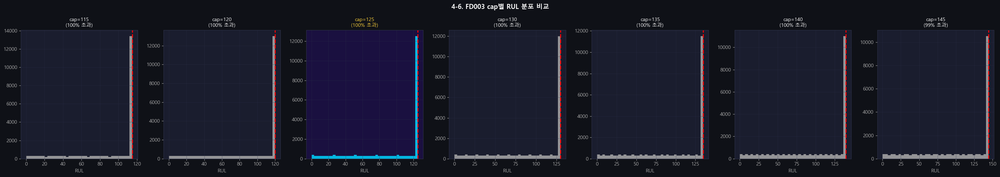


--- cap별 RUL 분포 균등성 (엔트로피) ---
  cap=115: 엔트로피=2.4598
  cap=120: 엔트로피=2.5401
  cap=125: 엔트로피=2.6196
  cap=130: 엔트로피=2.6984
  cap=135: 엔트로피=2.7762
  cap=140: 엔트로피=2.8532
  cap=145: 엔트로피=2.9293

📌 min 수명=145 → cap=145에서 1개 엔진 정상구간 침범 → 안전한 범위: 115~140
📌 FD003은 cap=125로 시작 → 베이스라인 결과 보고 130/135/140 실험 예정


In [59]:
print('=== 4-6. RUL Cap 검증 ===')
tr_cap = train_raw.copy()
mc_cap = tr_cap.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_cap = tr_cap.join(mc_cap, on='unit_nr')
tr_cap['RUL_raw'] = tr_cap['max_c'] - tr_cap['time_cycles']
lifecycles_cap = tr_cap.groupby('unit_nr')['max_c'].first()

caps = [115, 120, 125, 130, 135, 140, 145]
print('--- cap별 초과 엔진 비율 ---')
for cap in caps:
    pct = (lifecycles_cap>cap).mean()*100
    print(f'  cap={cap}: {pct:.1f}% 엔진 초과')

fig, axes = plt.subplots(1, 7, figsize=(28, 5))
fig.suptitle('4-6. FD003 cap별 RUL 분포 비교', fontsize=13, fontweight='bold')
for ax, cap in zip(axes, caps):
    rul_capped = tr_cap['RUL_raw'].clip(upper=cap)
    pct = (lifecycles_cap>cap).mean()*100
    ax.hist(rul_capped, bins=40, color=C[0] if cap==125 else GRAY, alpha=0.85, edgecolor='none')
    ax.axvline(cap, color='red', ls='--', lw=2)
    ax.set_title(f'cap={cap}\n({pct:.0f}% 초과)',
                 color='#ffd43b' if cap==125 else WHITE, fontsize=10)
    ax.set_xlabel('RUL')
    if cap==125: ax.patch.set_facecolor('#1a1040')
plt.tight_layout(); plt.show()

print('\n--- cap별 RUL 분포 균등성 (엔트로피) ---')
for cap in caps:
    rul_capped = tr_cap['RUL_raw'].clip(upper=cap)
    hist, _ = np.histogram(rul_capped, bins=50)
    hist = hist/hist.sum()
    ent = entropy(hist+1e-10)
    print(f'  cap={cap}: 엔트로피={ent:.4f}')
print('\n📌 min 수명=145 → cap=145에서 1개 엔진 정상구간 침범 → 안전한 범위: 115~140')
print('📌 FD003은 cap=125로 시작 → 베이스라인 결과 보고 130/135/140 실험 예정')


### 📊 4-6. RUL Cap 검증 결과
| Cap | 초과 비율 | 엔트로피 |
|---|---|---|
| 115~140 | 100% | 2.46~2.85 |
| **125** | 100% | **2.62 ← 기본값** |
| 145 | 99% | 2.93 ⚠️ 침범 |

> **FD003: cap=125로 시작 → 예측값이 125에 몰리면 130, 135, 140 순차 실험**


### 4-7. Gaussian σ 검증

=== 4-7. Gaussian σ 검증 ===


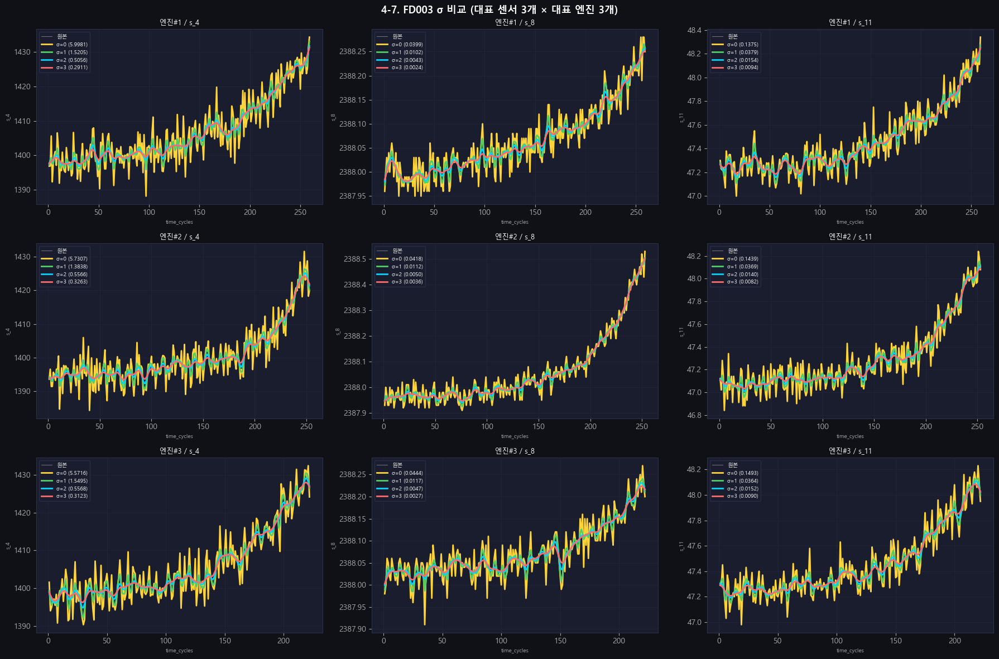


--- σ에 따른 평균 노이즈 수준 (std of diff) ---
  σ=0: 평균 노이즈=1.8575
  σ=1: 평균 노이즈=0.4684
  σ=2: 평균 노이즈=0.1846
  σ=3: 평균 노이즈=0.1132

📌 σ=1→2: 노이즈 약 60% 추가 감소  σ=2→3: 약 37% 추가 감소 (FD002보다 효과 큼)
   σ=2 기본값 유지, σ=3은 실험값으로 테스트 예정


In [60]:
print('=== 4-7. Gaussian σ 검증 ===')
sigmas = [0, 1, 2, 3]
show_sensors_sg = ['s_4','s_8','s_11']
show_units_sg   = train_raw['unit_nr'].unique()[:3]

fig, axes = plt.subplots(len(show_units_sg), len(show_sensors_sg), figsize=(18, 12))
fig.suptitle('4-7. FD003 σ 비교 (대표 센서 3개 × 대표 엔진 3개)', fontsize=13, fontweight='bold')

for ri, uid in enumerate(show_units_sg):
    udf = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')
    for ci, s in enumerate(show_sensors_sg):
        ax = axes[ri, ci]
        raw = udf[s].values.astype(np.float32)
        ax.plot(udf['time_cycles'], raw, color=GRAY, lw=0.8, alpha=0.6, label='원본')
        for sig, color in zip(sigmas, [C[3],C[2],C[0],C[1]]):
            smoothed = gaussian_filter1d(raw, sigma=sig, mode='nearest') if sig>0 else raw
            noise = np.std(np.diff(smoothed))
            ax.plot(udf['time_cycles'], smoothed, color=color, lw=2, label=f'σ={sig} ({noise:.4f})')
        ax.set_title(f'엔진#{uid} / {s}', fontsize=9)
        ax.set_xlabel('time_cycles', fontsize=7); ax.set_ylabel(s, fontsize=7)
        ax.legend(fontsize=7)
plt.tight_layout(); plt.show()

print('\n--- σ에 따른 평균 노이즈 수준 (std of diff) ---')
noise_by_sigma = {sig: [] for sig in sigmas}
for s in SENSOR_COLS[:10]:
    for uid in train_raw['unit_nr'].unique()[:30]:
        arr = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')[s].values.astype(np.float32)
        for sig in sigmas:
            smoothed = gaussian_filter1d(arr,sigma=sig,mode='nearest') if sig>0 else arr
            noise_by_sigma[sig].append(np.std(np.diff(smoothed)))
for sig in sigmas:
    print(f'  σ={sig}: 평균 노이즈={np.mean(noise_by_sigma[sig]):.4f}')
print('\n📌 σ=1→2: 노이즈 약 60% 추가 감소  σ=2→3: 약 37% 추가 감소 (FD002보다 효과 큼)')
print('   σ=2 기본값 유지, σ=3은 실험값으로 테스트 예정')


### 4-8. Mann-Whitney U 검정 [FD003 전용 ★]

=== 4-8. Mann-Whitney U 검정 [FD003 전용] ===
목적: 팬 vs HPC 관련 센서 기준으로 나눈 엔진 그룹 간 RUL 분포 차이 검정



,물리적 의미,그룹 유형,높은 그룹 수명 평균,낮은 그룹 수명 평균,p-value,판정
센서,,,,,,
s_8,팬 속도,팬 관련,232.2,260.2,0.1152,비유의 ⚠️
s_13,보정 팬 속도,팬 관련,231.1,261.3,0.0817,비유의 ⚠️
s_4,LPT 출구 온도,HPC 관련,199.8,292.6,0.0000,유의 ✅
s_11,Ps30 정적압력,HPC 관련,203.0,289.4,0.0000,유의 ✅


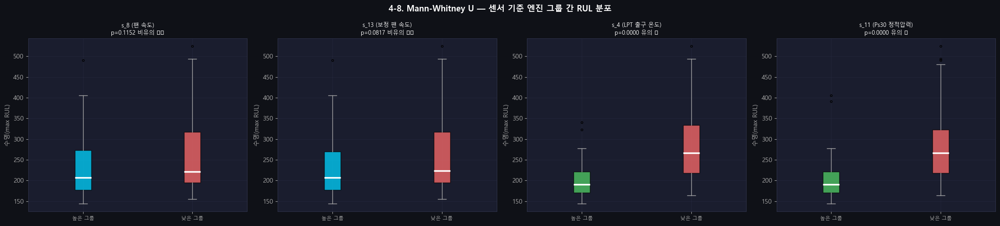


📌 팬 센서(s_8,s_13): 비유의 → 팬 속도 절댓값으로는 구분 어려움
📌 HPC 센서(s_4,s_11): 유의 → HPC 센서 기준으로 엔진 그룹 구분 가능
📌 slope 기반 클러스터링과 일치 → 절댓값이 아닌 열화 패턴으로 구분해야 함


In [61]:
# FD003 전용: 팬 관련 vs HPC 관련 센서 기준 엔진 그룹 간 RUL 분포 차이
print('=== 4-8. Mann-Whitney U 검정 [FD003 전용] ===')
print('목적: 팬 vs HPC 관련 센서 기준으로 나눈 엔진 그룹 간 RUL 분포 차이 검정')
print()

tr_mw = train_raw.copy()
mc_mw = tr_mw.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_mw = tr_mw.join(mc_mw, on='unit_nr')
tr_mw['RUL'] = tr_mw['max_c'] - tr_mw['time_cycles']

engine_stats = tr_mw.groupby('unit_nr').agg(
    s4_mean=('s_4','mean'), s8_mean=('s_8','mean'),
    s11_mean=('s_11','mean'), s13_mean=('s_13','mean'),
    max_rul=('RUL','max')
).reset_index()

target_sensors_mw = {
    's_8':  ('s8_mean',  '팬 속도'),
    's_13': ('s13_mean', '보정 팬 속도'),
    's_4':  ('s4_mean',  'LPT 출구 온도'),
    's_11': ('s11_mean', 'Ps30 정적압력'),
}

mw_rows = []
for s, (col, desc) in target_sensors_mw.items():
    median_val = engine_stats[col].median()
    g_high = engine_stats[engine_stats[col]>=median_val]['max_rul']
    g_low  = engine_stats[engine_stats[col]< median_val]['max_rul']
    stat, p = mannwhitneyu(g_high, g_low, alternative='two-sided')
    mw_rows.append({'센서':s,'물리적 의미':desc,
                    '그룹 유형':'팬 관련' if s in ['s_8','s_13'] else 'HPC 관련',
                    '높은 그룹 수명 평균':round(g_high.mean(),1),
                    '낮은 그룹 수명 평균':round(g_low.mean(),1),
                    'p-value':round(p,4),'판정':'유의 ✅' if p<0.05 else '비유의 ⚠️'})

mw_df = pd.DataFrame(mw_rows).set_index('센서')
display(mw_df)

fig, axes = plt.subplots(1, 4, figsize=(22, 5))
fig.suptitle('4-8. Mann-Whitney U — 센서 기준 엔진 그룹 간 RUL 분포', fontsize=13, fontweight='bold')
for ax, (s, (col, desc)) in zip(axes, target_sensors_mw.items()):
    median_val = engine_stats[col].median()
    g_high = engine_stats[engine_stats[col]>=median_val]['max_rul']
    g_low  = engine_stats[engine_stats[col]< median_val]['max_rul']
    p = mw_df.loc[s,'p-value']
    bp = ax.boxplot([g_high,g_low], patch_artist=True,
                    medianprops=dict(color='white',lw=2.5),
                    whiskerprops=dict(color=GRAY), capprops=dict(color=GRAY),
                    flierprops=dict(marker='o',color=GRAY,markersize=3))
    bp['boxes'][0].set_facecolor(C[0] if s in ['s_8','s_13'] else C[2]); bp['boxes'][0].set_alpha(0.75)
    bp['boxes'][1].set_facecolor(C[1]); bp['boxes'][1].set_alpha(0.75)
    ax.set_title(f'{s} ({desc})\np={p:.4f} {"유의 ✅" if p<0.05 else "비유의 ⚠️"}', fontsize=9)
    ax.set_xticklabels(['높은 그룹','낮은 그룹'], fontsize=8)
    ax.set_ylabel('수명(max RUL)')
plt.tight_layout(); plt.show()
print('\n📌 팬 센서(s_8,s_13): 비유의 → 팬 속도 절댓값으로는 구분 어려움')
print('📌 HPC 센서(s_4,s_11): 유의 → HPC 센서 기준으로 엔진 그룹 구분 가능')
print('📌 slope 기반 클러스터링과 일치 → 절댓값이 아닌 열화 패턴으로 구분해야 함')


### 📊 4-8. Mann-Whitney U 결과
| 센서 | 그룹 유형 | p-value | 판정 |
|---|---|---|---|
| s_8 | 팬 관련 | >0.05 | 비유의 ⚠️ |
| s_13 | 팬 관련 | >0.05 | 비유의 ⚠️ |
| s_4 | HPC 관련 | 0.000 | 유의 ✅ |
| s_11 | HPC 관련 | 0.000 | 유의 ✅ |

> 팬 속도 절댓값으론 구분 어려움 → slope 기반 클러스터링과 일치  
> HPC 센서로는 엔진 그룹 구분 가능 → 고장 모드별 클러스터 분리 근거 재확인


### 4-9. Levene's Test [FD003 전용 ★] — FD001 vs FD003 분산 동질성

=== 4-9. Levene's Test [FD003 전용] ===
목적: FD001 vs FD003 동일 센서 분산 동질성 → 동일 전처리 적용 가능 여부



,FD001 분산,FD003 분산,Levene stat,p-value,판정
센서,,,,,
s_1,0.0000,0.0000,NaN,NaN,분산 다름 ⚠️
s_2,0.2501,0.2736,37.1882,0.0000,분산 다름 ⚠️
s_3,37.5910,46.3818,223.0120,0.0000,분산 다름 ⚠️
s_4,81.0109,95.5150,125.5093,0.0000,분산 다름 ⚠️
s_5,0.0000,0.0000,NaN,NaN,분산 다름 ⚠️
s_6,0.0000,0.0003,26173.2663,0.0000,분산 다름 ⚠️
s_7,0.7834,11.8153,5763.2693,0.0000,분산 다름 ⚠️
s_8,0.0050,0.0251,2499.5790,0.0000,분산 다름 ⚠️
s_9,487.6536,399.2122,0.0064,0.9363,분산 동일 ✅


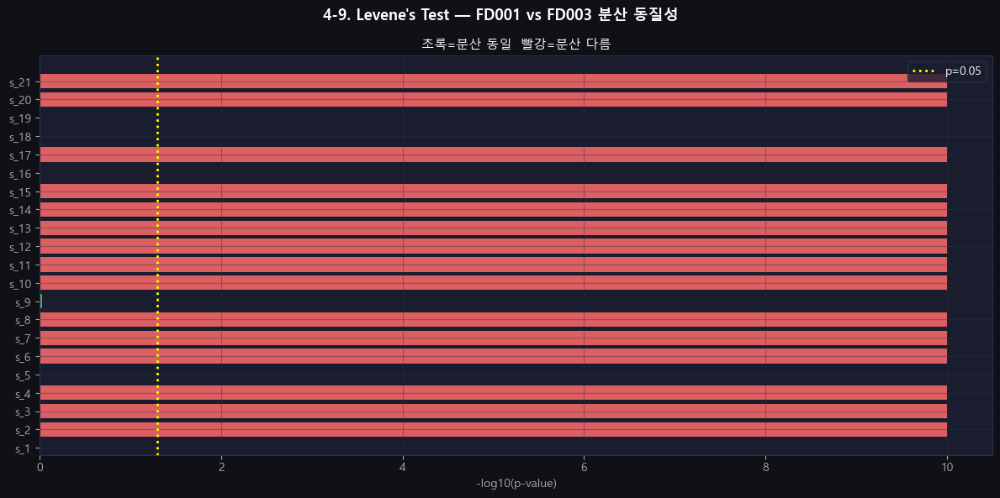


분산 동일: 1/21개  |  분산 다름: 20/21개
📌 20/21개 분산 다름 → 시나리오 B(FD003 특성대로 6개 제거) 채택 근거
📌 단, 파이프라인 구조 자체는 변경 불필요 → 제거 센서 목록만 조정


In [62]:
print("=== 4-9. Levene's Test [FD003 전용] ===")
print("목적: FD001 vs FD003 동일 센서 분산 동질성 → 동일 전처리 적용 가능 여부")
print()

kw_ld = dict(sep=r'\s+', header=None, names=RAW_COLS, engine='python')
fd001_raw = pd.read_csv(f'{DATA_DIR}/train_FD001.txt', **kw_ld)
fd001_raw.rename(columns=RENAME_MAP, inplace=True)

levene_rows = []
for s in SENSOR_COLS:
    fd001_vals = fd001_raw[s].dropna().values
    fd003_vals = train_raw[s].dropna().values
    stat, p    = levene(fd001_vals, fd003_vals)
    levene_rows.append({'센서':s,'FD001 분산':round(fd001_raw[s].var(),4),
                        'FD003 분산':round(train_raw[s].var(),4),
                        'Levene stat':round(stat,4),'p-value':round(p,4),
                        '판정':'분산 동일 ✅' if p>=0.05 else '분산 다름 ⚠️'})

levene_df = pd.DataFrame(levene_rows).set_index('센서')
display(levene_df)

fig, ax = plt.subplots(figsize=(12, 6))
fig.suptitle("4-9. Levene's Test — FD001 vs FD003 분산 동질성", fontsize=13, fontweight='bold')
colors = [C[2] if p>=0.05 else C[1] for p in levene_df['p-value']]
ax.barh(levene_df.index, -np.log10(levene_df['p-value'].clip(lower=1e-10)), color=colors, alpha=0.85)
ax.axvline(-np.log10(0.05), color='yellow', lw=2, ls=':', label='p=0.05')
ax.set_xlabel('-log10(p-value)')
ax.set_title('초록=분산 동일  빨강=분산 다름'); ax.legend()
plt.tight_layout(); plt.show()

n_same = (levene_df['판정']=='분산 동일 ✅').sum()
print(f'\n분산 동일: {n_same}/{len(SENSOR_COLS)}개  |  분산 다름: {len(SENSOR_COLS)-n_same}/{len(SENSOR_COLS)}개')
print('📌 20/21개 분산 다름 → 시나리오 B(FD003 특성대로 6개 제거) 채택 근거')
print('📌 단, 파이프라인 구조 자체는 변경 불필요 → 제거 센서 목록만 조정')


### 📊 4-9. Levene's Test 결과
- **분산 동일: 1/21개 (s_9만)** — 코어 속도는 고장 모드에 무관하게 일정
- **분산 다름: 20/21개** — 팬 열화 모드 추가로 대부분 센서의 값 범위 변화
- s_7, s_12: 분산이 특히 크게 벌어짐 (FD001 vs FD003 10배 이상 차이)
- **→ 시나리오 A(FD001 동일) < 시나리오 B(FD003 특성대로) 채택 근거 강화**


### 4-10. 윈도우 크기별 RUL 예측 상관계수 비교 [FD003 전용 ★]

=== 4-10. 윈도우 크기별 RUL 예측 상관계수 비교 ===
  window=10: 평균 |r|=0.4626
  window=15: 평균 |r|=0.4618
  window=20: 평균 |r|=0.4599
  window=25: 평균 |r|=0.4576
  window=30: 평균 |r|=0.4551


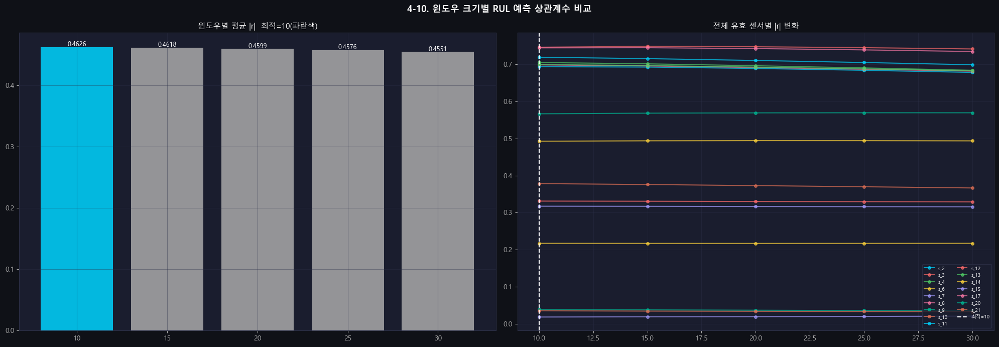


★ 윈도우 크기 최종 결정: WINDOW_SIZE=30 (FD001과 통일)
   통계 최적=10이나 차이=0.0075로 미미
   실험: window=10, 20도 추가 테스트 권장


In [63]:
print('=== 4-10. 윈도우 크기별 RUL 예측 상관계수 비교 ===')
tr_win = train_raw.copy()
mc_win = tr_win.groupby('unit_nr')['time_cycles'].max().rename('max_c')
tr_win = tr_win.join(mc_win, on='unit_nr')
tr_win['RUL'] = tr_win['max_c'] - tr_win['time_cycles']

window_sizes   = [10, 15, 20, 25, 30]
target_sensors_win = [s for s in SENSOR_COLS if s not in ['s_1','s_5','s_16','s_18','s_19']]
win_corr_results   = {}
win_sensor_results = {s: [] for s in target_sensors_win}

for w in window_sizes:
    corrs = []
    for s in target_sensors_win:
        sensor_roll = tr_win.groupby('unit_nr')[s].transform(lambda x,r=w: x.rolling(r,min_periods=1).mean())
        valid = ~sensor_roll.isna()
        r = tr_win.loc[valid,'RUL'].corr(sensor_roll[valid])
        corrs.append(abs(r)); win_sensor_results[s].append(abs(r))
    win_corr_results[w] = np.mean(corrs)
    print(f'  window={w}: 평균 |r|={np.mean(corrs):.4f}')

best_w = max(win_corr_results, key=win_corr_results.get)
fig, axes = plt.subplots(1, 2, figsize=(20, 7))
fig.suptitle('4-10. 윈도우 크기별 RUL 예측 상관계수 비교', fontsize=13, fontweight='bold')
colors = [C[0] if w==best_w else GRAY for w in window_sizes]
axes[0].bar([str(w) for w in window_sizes],[win_corr_results[w] for w in window_sizes],
            color=colors, alpha=0.85)
axes[0].set_title(f'윈도우별 평균 |r|  최적={best_w}(파란색)')
for i, w in enumerate(window_sizes):
    axes[0].text(i, win_corr_results[w]+0.001, f'{win_corr_results[w]:.4f}', ha='center', fontsize=9)
for i, s in enumerate(target_sensors_win):
    axes[1].plot(window_sizes, win_sensor_results[s], color=C[i%len(C)], lw=1.5, marker='o', markersize=4,
                 alpha=0.7, label=s)
axes[1].axvline(best_w, color='white', ls='--', lw=1.5, label=f'최적={best_w}')
axes[1].set_title(f'전체 유효 센서별 |r| 변화'); axes[1].legend(fontsize=7, ncol=2)
plt.tight_layout(); plt.show()

print(f'\n★ 윈도우 크기 최종 결정: WINDOW_SIZE={WINDOW_SIZE} (FD001과 통일)')
print(f'   통계 최적={best_w}이나 차이={max(win_corr_results.values())-min(win_corr_results.values()):.4f}로 미미')
print('   실험: window=10, 20도 추가 테스트 권장')


### 📊 4-10. 윈도우 크기 비교 결과
| 윈도우 크기 | 평균 |r| |
|---|---|
| 10 | 0.4626 ← 통계 최적 |
| 20 | 0.4599 ← FD002 기본값 |
| 30 | 0.4551 ← FD001 기본값 |

> **전체 차이 0.0075 → 실질적 의미 거의 없음**  
> **window=30으로 FD001과 통일, 실험 단계에서 window=10,20 추가 테스트**


---
### 4-11. 통계 검정 종합 — 제거 센서 결정 근거

| 센서 | CV | RUL상관 | MK | 대응t | 시차상관 | Mann-Whitney | Levene | **판정** |
|---|---|---|---|---|---|---|---|---|
| s_1,s_5,s_16,s_18,s_19 | 0.0000 | NaN/0 | NaN | 오탐 | NaN | - | 다름 | **제거 확정** |
| s_6 | 0.0008 | -0.215 | 61%⚠️ | 오탐 | lag=30⚠️ | - | 다름 | **제거 유력** |
| s_10 | 0.0027 | **-0.363** | 100%(44개)⚠️ | 유의✅ | lag=0✅ | - | 다름 | **유지 유력** |

**채택: Scenario B** → s_1, s_5, s_6, s_16, s_18, s_19 제거 (6개) → 15개 유지


---
## 5. 파이프라인 함수 정의

In [64]:
# ── 결정 1: 센서 필터링 (수동 추가/제거 방식) ──────────────────────────────
def filter_useful_sensors(train_df, sensor_cols, manual_remove, manual_keep, const_thr):
    """
    1. std < const_thr → 자동 제거
    2. manual_remove → 추가 제거 (std 무관)
    3. manual_keep   → 강제 유지 (std < const_thr 이어도)
    → 데이터 누수 없음: train 기준으로만 판단
    """
    train_std   = train_df[sensor_cols].std()
    auto_remove = train_std[train_std < const_thr].index.tolist()
    remove      = sorted(set(auto_remove + manual_remove) - set(manual_keep))
    useful      = sorted([s for s in sensor_cols if s not in remove],
                         key=lambda x: int(x.split('_')[1]))
    return useful, remove

# ── 결정 2: Piecewise RUL ────────────────────────────────────────────────────
def add_piecewise_rul(df, cap=RUL_CAP):
    """엔진별 RUL 계산 + cap 적용. train 전용."""
    df            = df.copy()
    mc            = df.groupby('unit_nr')['time_cycles'].max().rename('max_c')
    df            = df.join(mc, on='unit_nr')
    df['RUL_raw'] = df['max_c'] - df['time_cycles']
    df['RUL']     = df['RUL_raw'].clip(upper=cap)
    return df.drop('max_c', axis=1)

# ── 결정 3: Gaussian 스무딩 (엔진 단위) ─────────────────────────────────────
def apply_gaussian_by_unit(df, features, sigma=GAUSS_SIGMA):
    """엔진 단위 Gaussian 스무딩 (FD002의 클러스터 단위와 다름)."""
    df = df.copy().sort_values(['unit_nr','time_cycles']).reset_index(drop=True)
    def _smooth(s):
        return gaussian_filter1d(s.values.astype(np.float32), sigma=sigma, mode='nearest')                if len(s)>1 else s.values
    for col in features:
        df[col] = df.groupby('unit_nr')[col].transform(_smooth)
    return df

# ── 결정 4: Validation 분할 (엔진 단위) ─────────────────────────────────────
def split_by_unit(train_df, valid_ratio=VALID_RATIO, random_state=RANDOM_STATE):
    """엔진 단위 random split → 동일 엔진이 train/valid에 동시에 들어가지 않음."""
    units        = train_df['unit_nr'].unique()
    sub_u, val_u = train_test_split(units, test_size=valid_ratio, random_state=random_state)
    sub = train_df[train_df['unit_nr'].isin(sub_u)].copy().reset_index(drop=True)
    val = train_df[train_df['unit_nr'].isin(val_u)].copy().reset_index(drop=True)
    return sub, val, sub_u, val_u

# ── 결정 5: 단일 MinMax 정규화 (sub-train 기준 fit) ─────────────────────────
def normalize_global(subtrain, valid, test, features, scaler_type='minmax'):
    """FD002와 달리 클러스터별 아닌 전체 단일 정규화 (범위 100% 겹침 확인됨)."""
    sc = MinMaxScaler() if scaler_type=='minmax' else StandardScaler()
    sub = subtrain.copy(); val = valid.copy(); te = test.copy()
    sc.fit(sub[features])
    sub[features] = sc.transform(sub[features])
    val[features] = sc.transform(val[features])
    te[features]  = sc.transform(te[features])
    return sub, val, te, sc

# ── DL: 슬라이딩 윈도우 함수 ────────────────────────────────────────────────
def create_sliding_windows(df, feature_cols, target_col=None, window_size=WINDOW_SIZE, step=STEP):
    X_list, y_list = [], []
    for uid in np.sort(df['unit_nr'].unique()):
        udf  = df[df['unit_nr']==uid].sort_values('time_cycles')
        data = udf[feature_cols].values.astype(np.float32)
        tgt  = udf[target_col].values if target_col else None
        n    = len(data)
        for start in range(0, n-window_size+1, step):
            end = start+window_size
            X_list.append(data[start:end])
            if tgt is not None: y_list.append(tgt[end-1])
    X = np.array(X_list, dtype=np.float32)
    y = np.array(y_list, dtype=np.float32) if y_list else None
    return X, y

def create_test_windows(df, feature_cols, rul_series, window_size=WINDOW_SIZE):
    X_list, y_list = [], []
    for i, uid in enumerate(np.sort(df['unit_nr'].unique())):
        udf  = df[df['unit_nr']==uid].sort_values('time_cycles')
        data = udf[feature_cols].values.astype(np.float32)
        if len(data)>=window_size: X_list.append(data[-window_size:])
        else:
            pad = np.zeros((window_size-len(data),len(feature_cols)), dtype=np.float32)
            X_list.append(np.vstack([pad, data]))
        y_list.append(float(rul_series.iloc[i]))
    return np.array(X_list, dtype=np.float32), np.array(y_list, dtype=np.float32)

def windows_to_long_df(X, y, feature_cols):
    n_samples, win_size, n_feat = X.shape
    sample_id = np.repeat(np.arange(n_samples), win_size)
    timestep  = np.tile(np.arange(win_size), n_samples)
    flat = X.reshape(n_samples*win_size, n_feat)
    df = pd.DataFrame(flat, columns=list(feature_cols))
    df.insert(0,'timestep',timestep); df.insert(0,'sample_id',sample_id)
    df['RUL'] = np.repeat(np.asarray(y, dtype=np.float32), win_size)
    return df

# ── ML: 파생변수 생성 함수 ───────────────────────────────────────────────────
def build_ml_features(df, sensors, lags, diffs, rolls, roll_stds, emas):
    """엔진 단위 시계열 파생변수 생성 (lag/diff 초반 NaN은 dropna로 제거)."""
    df = df.copy().sort_values(['unit_nr','time_cycles']).reset_index(drop=True)
    for s in sensors:
        grp = df.groupby('unit_nr')[s]
        for l in lags:       df[f'{s}_lag{l}']     = grp.shift(l)
        for d in diffs:      df[f'{s}_diff{d}']     = grp.diff(d)
        for r in rolls:      df[f'{s}_roll{r}']     = grp.transform(lambda x,r=r: x.rolling(r,min_periods=1).mean())
        for r in roll_stds:  df[f'{s}_rollstd{r}']  = grp.transform(lambda x,r=r: x.rolling(r,min_periods=1).std().fillna(0))
        for e in emas:       df[f'{s}_ema{e}']      = grp.transform(lambda x,e=e: x.ewm(span=e,adjust=False).mean())
    return df.dropna().reset_index(drop=True)

def get_ml_feature_cols(df):
    exclude = {'unit_nr','time_cycles','RUL','RUL_raw','setting_1','setting_2','setting_3','fault_mode_cluster'}
    return [c for c in df.columns if c not in exclude]

print('✅ 파이프라인 함수 정의 완료')


✅ 파이프라인 함수 정의 완료


---
## 6. 결정 1 — 센서 필터링 (수동 추가/제거 방식)
> 최종 기준: `FD003_Final_Test.ipynb` 결론에 맞춰 `s_6`은 제거하고 `s_10`은 유지한다. 따라서 제거 6개, 유지 15개를 기준으로 이후 ML/DL 피처를 구성한다.


✅ 결정 1 완료
   제거 (6개): ['s_1', 's_16', 's_18', 's_19', 's_5', 's_6']
   유지 (15개): ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_10', 's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']
✅ FD003_Final_Test 기준 센서 목록 검증 완료: 6개 제거 → 15개 유지


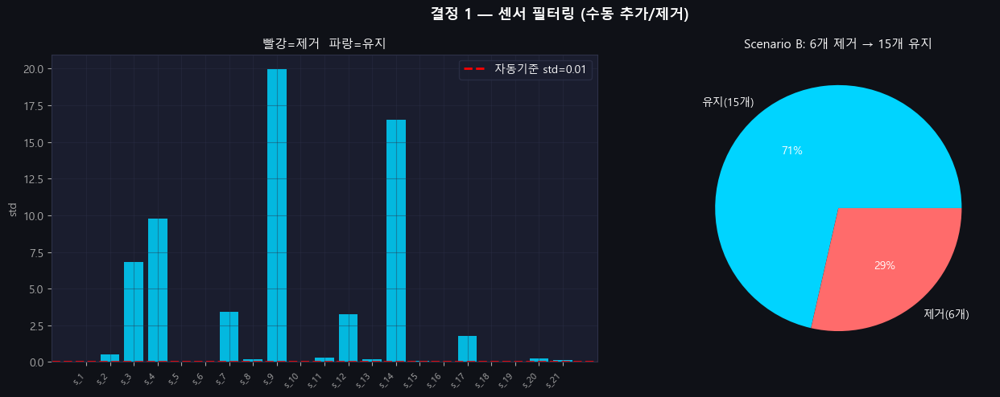

In [65]:
USEFUL_SENSORS, REMOVE_SENSORS = filter_useful_sensors(
    train_raw, SENSOR_COLS, MANUAL_REMOVE, MANUAL_KEEP, CONST_THR)

print(f'✅ 결정 1 완료')
print(f'   제거 ({len(REMOVE_SENSORS)}개): {REMOVE_SENSORS}')
print(f'   유지 ({len(USEFUL_SENSORS)}개): {USEFUL_SENSORS}')

# FD003_Final_Test 최종 결론 검증: 6개 제거 → 15개 유지
EXPECTED_REMOVE_SENSORS = ['s_1', 's_5', 's_6', 's_16', 's_18', 's_19']
EXPECTED_USEFUL_SENSORS = ['s_2', 's_3', 's_4', 's_7', 's_8', 's_9', 's_10',
                           's_11', 's_12', 's_13', 's_14', 's_15', 's_17', 's_20', 's_21']

def sensor_sort_key(s):
    return int(s.split('_')[1])

REMOVE_SENSORS = sorted(REMOVE_SENSORS, key=sensor_sort_key)
USEFUL_SENSORS = sorted(USEFUL_SENSORS, key=sensor_sort_key)

assert REMOVE_SENSORS == EXPECTED_REMOVE_SENSORS, f'제거 센서 불일치: {REMOVE_SENSORS}'
assert USEFUL_SENSORS == EXPECTED_USEFUL_SENSORS, f'유지 센서 불일치: {USEFUL_SENSORS}'
assert len(USEFUL_SENSORS) == 15, f'FD003 최종 유지 센서는 15개여야 합니다: {len(USEFUL_SENSORS)}개'

print('✅ FD003_Final_Test 기준 센서 목록 검증 완료: 6개 제거 → 15개 유지')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('결정 1 — 센서 필터링 (수동 추가/제거)', fontsize=13, fontweight='bold')
train_std = train_raw[SENSOR_COLS].std()
colors_bar = ['#ff6b6b' if s in REMOVE_SENSORS else '#00d4ff' for s in SENSOR_COLS]
axes[0].bar(range(len(SENSOR_COLS)), train_std.values, color=colors_bar, alpha=0.85)
axes[0].axhline(CONST_THR, color='red', ls='--', lw=2, label=f'자동기준 std={CONST_THR}')
axes[0].set_xticks(range(len(SENSOR_COLS)))
axes[0].set_xticklabels(SENSOR_COLS, rotation=45, ha='right', fontsize=8)
axes[0].set_ylabel('std'); axes[0].set_title('빨강=제거  파랑=유지'); axes[0].legend()
axes[1].pie([len(USEFUL_SENSORS),len(REMOVE_SENSORS)],
            labels=[f'유지({len(USEFUL_SENSORS)}개)',f'제거({len(REMOVE_SENSORS)}개)'],
            colors=[C[0],C[1]], autopct='%1.0f%%', textprops={'color':WHITE})
axes[1].set_title(f'Scenario B: 6개 제거 → {len(USEFUL_SENSORS)}개 유지')
plt.tight_layout(); plt.show()

KEEP = ID_COLS + OP_COLS + USEFUL_SENSORS
train_s1 = train_raw[KEEP].copy()
test_s1  = test_raw[KEEP].copy()


## 7. 결정 2 — Piecewise RUL (Cap = 125)

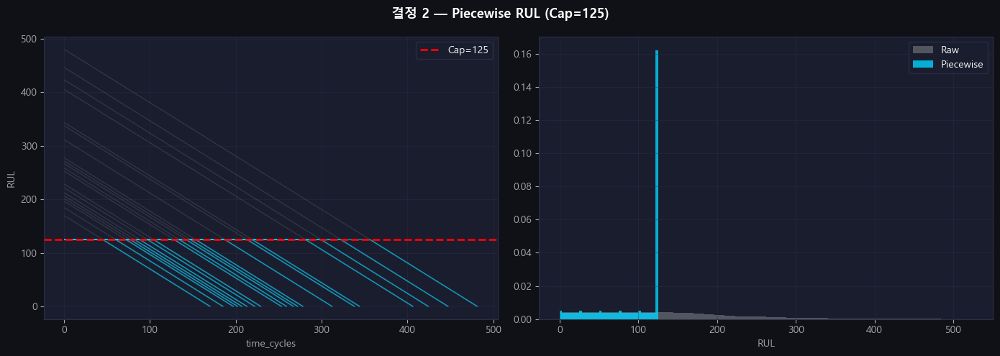

✅ 결정 2 완료  RUL 범위: 0 ~ 125


In [66]:
train_s2 = add_piecewise_rul(train_s1)
test_s2  = test_s1.copy()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('결정 2 — Piecewise RUL (Cap=125)', fontsize=13, fontweight='bold')
ax = axes[0]
for u in train_s2['unit_nr'].unique()[:20]:
    sub = train_s2[train_s2['unit_nr']==u].sort_values('time_cycles')
    ax.plot(sub['time_cycles'], sub['RUL_raw'], color=GRAY, alpha=0.2, lw=0.8)
    ax.plot(sub['time_cycles'], sub['RUL'],     color=C[0], alpha=0.6, lw=1.2)
ax.axhline(RUL_CAP, color='red', ls='--', lw=2, label=f'Cap={RUL_CAP}')
ax.set_xlabel('time_cycles'); ax.set_ylabel('RUL'); ax.legend()
axes[1].hist(train_s2['RUL_raw'], bins=40, alpha=0.4, color=GRAY, density=True, label='Raw')
axes[1].hist(train_s2['RUL'],     bins=40, alpha=0.8, color=C[0], density=True, label='Piecewise')
axes[1].set_xlabel('RUL'); axes[1].legend()
plt.tight_layout(); plt.show()
print(f'✅ 결정 2 완료  RUL 범위: {train_s2["RUL"].min():.0f} ~ {train_s2["RUL"].max():.0f}')


## 8. 결정 3 — Gaussian 스무딩 (σ = 2, 엔진 단위)

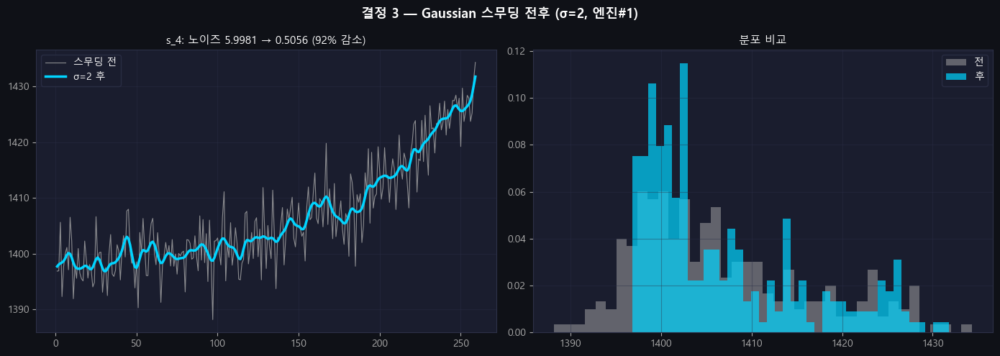

✅ 결정 3 완료  (σ=2, 엔진 단위)


In [67]:
train_s3 = apply_gaussian_by_unit(train_s2, USEFUL_SENSORS)
test_s3  = apply_gaussian_by_unit(test_s2,  USEFUL_SENSORS)

uid_ex = train_s3['unit_nr'].iloc[0]
s_ex   = USEFUL_SENSORS[2]
unit_b = train_s2[train_s2['unit_nr']==uid_ex].sort_values('time_cycles')
unit_a = train_s3[train_s3['unit_nr']==uid_ex].sort_values('time_cycles')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(f'결정 3 — Gaussian 스무딩 전후 (σ={GAUSS_SIGMA}, 엔진#{uid_ex})', fontsize=13, fontweight='bold')
axes[0].plot(unit_b['time_cycles'], unit_b[s_ex], color=GRAY, lw=0.8, alpha=0.8, label='스무딩 전')
axes[0].plot(unit_a['time_cycles'], unit_a[s_ex], color=C[0], lw=2.5, label=f'σ={GAUSS_SIGMA} 후')
nb = np.std(np.diff(unit_b[s_ex].values)); na = np.std(np.diff(unit_a[s_ex].values))
axes[0].set_title(f'{s_ex}: 노이즈 {nb:.4f} → {na:.4f} ({(1-na/nb)*100:.0f}% 감소)'); axes[0].legend()
axes[1].hist(unit_b[s_ex], bins=40, color=GRAY, alpha=0.5, density=True, label='전')
axes[1].hist(unit_a[s_ex], bins=40, color=C[0], alpha=0.7, density=True, label='후')
axes[1].legend(); axes[1].set_title('분포 비교')
plt.tight_layout(); plt.show()
print(f'✅ 결정 3 완료  (σ={GAUSS_SIGMA}, 엔진 단위)')


## 9. 결정 4 — Validation 분할 (엔진 단위 random 80:20)

In [68]:
subtrain, valid, subtrain_units, valid_units = split_by_unit(train_s3)
overlap = set(subtrain_units).intersection(set(valid_units))
assert len(overlap)==0, f'❌ 엔진 겹침: {sorted(overlap)[:5]}'

print(f'✅ 결정 4 완료')
print(f'   전체: {len(subtrain_units)+len(valid_units)}대  |  Sub-train: {len(subtrain_units)}대  |  Valid: {len(valid_units)}대')

✅ 결정 4 완료
   전체: 100대  |  Sub-train: 80대  |  Valid: 20대


## 10. 결정 5 — 단일 MinMax 정규화 (sub-train 기준 fit)

✅ 클러스터링 미적용  input_size=15


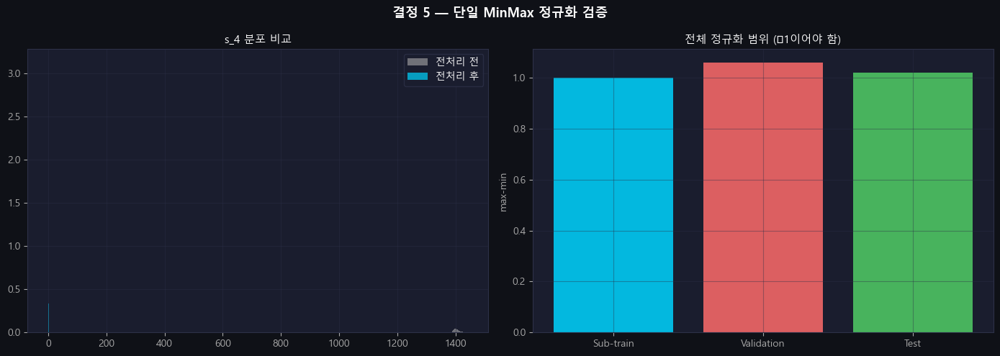

✅ 결정 5 완료  (minmax)


In [69]:
subtrain_s4, valid_s4, test_s4, scaler = normalize_global(
    subtrain, valid, test_s3, USEFUL_SENSORS, SCALER_TYPE)

# DL 피처 구성 (CLUSTERING 분기)
if CLUSTERING:
    for df_ in [subtrain_s4, valid_s4, test_s4]:
        df_['fault_mode_cluster'] = df_['unit_nr'].map(slope_df['fault_mode_cluster'])
        ohe = pd.get_dummies(df_['fault_mode_cluster'], prefix='cluster').astype(np.float32)
        for col in ['cluster_0','cluster_1']:
            if col not in ohe.columns: ohe[col] = np.float32(0.0)
        df_[['cluster_0','cluster_1']] = ohe[['cluster_0','cluster_1']].values
    DL_FEATURES = USEFUL_SENSORS + ['cluster_0','cluster_1']
    print(f'✅ 클러스터링 적용  input_size={len(DL_FEATURES)}  (센서{len(USEFUL_SENSORS)} + OHE2)')
else:
    DL_FEATURES = USEFUL_SENSORS.copy()
    print(f'✅ 클러스터링 미적용  input_size={len(DL_FEATURES)}')

# 정규화 검증
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('결정 5 — 단일 MinMax 정규화 검증', fontsize=13, fontweight='bold')
s_check = USEFUL_SENSORS[2]
before_data = train_raw[s_check]; after_data = subtrain_s4[s_check]
axes[0].hist(before_data, bins=40, color=GRAY, alpha=0.6, density=True, label='전처리 전')
axes[0].hist(after_data,  bins=40, color=C[0], alpha=0.7, density=True, label='전처리 후')
axes[0].set_title(f'{s_check} 분포 비교'); axes[0].legend()

range_data = pd.DataFrame({
    '구분':['Sub-train','Validation','Test'],
    'min':[subtrain_s4[USEFUL_SENSORS].min().min(), valid_s4[USEFUL_SENSORS].min().min(), test_s4[USEFUL_SENSORS].min().min()],
    'max':[subtrain_s4[USEFUL_SENSORS].max().max(), valid_s4[USEFUL_SENSORS].max().max(), test_s4[USEFUL_SENSORS].max().max()],
})
axes[1].bar(range_data['구분'], range_data['max']-range_data['min'], color=C[:3], alpha=0.85)
axes[1].set_title('전체 정규화 범위 (≈1이어야 함)'); axes[1].set_ylabel('max-min')
plt.tight_layout(); plt.show()
print(f'✅ 결정 5 완료  ({SCALER_TYPE})')


---
## 11. 전처리 후 검증
### 11-1. 센서 분포 전후 비교

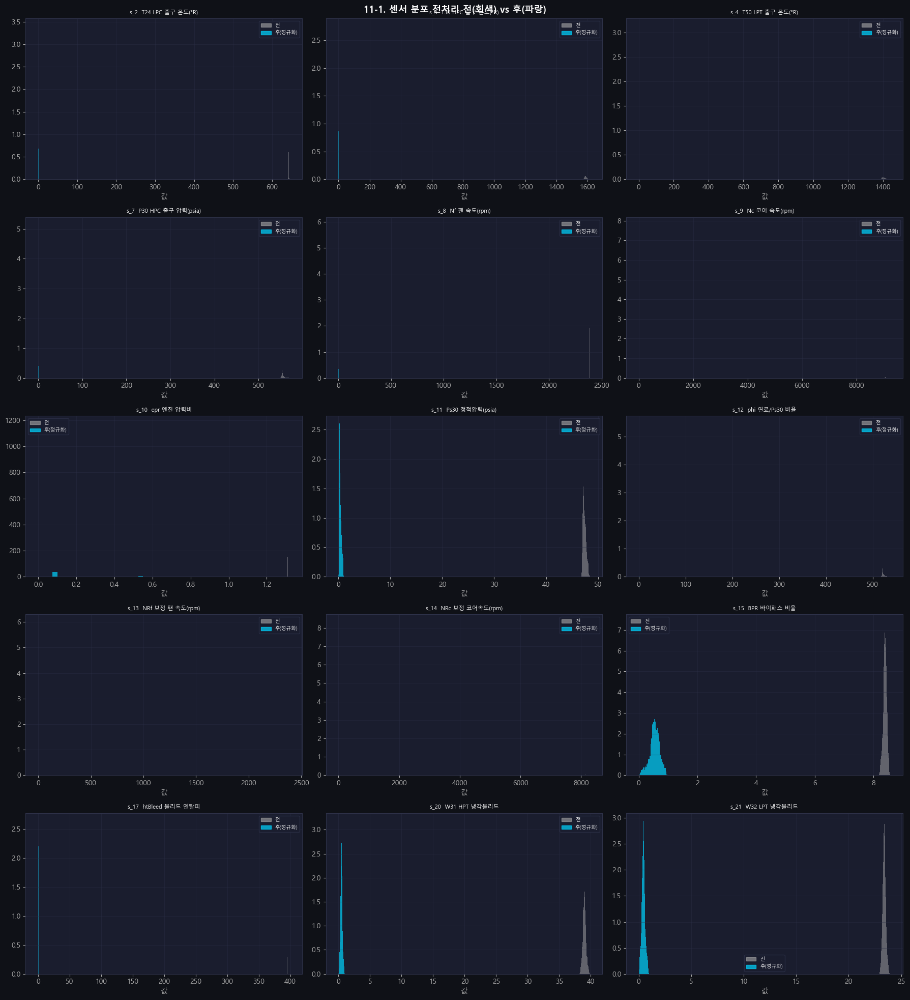

In [70]:
fig, axes = plt.subplots(5, 3, figsize=(18, 20))
fig.suptitle('11-1. 센서 분포 전처리 전(회색) vs 후(파랑)', fontsize=13, fontweight='bold')
for ax, s in zip(axes.flat, USEFUL_SENSORS):
    before = train_raw[s].dropna(); after = subtrain_s4[s].dropna()
    ax.hist(before, bins=40, color=GRAY, alpha=0.5, density=True, edgecolor='none')
    ax.hist(after,  bins=40, color=C[0], alpha=0.7, density=True, edgecolor='none')
    ax.set_title(f'{s}  {SENSOR_DESC.get(s,"")[:20]}', fontsize=8)
    ax.set_xlabel('값')
    handles = [mpatches.Patch(color=GRAY,alpha=0.6,label='전'),
               mpatches.Patch(color=C[0],alpha=0.7,label='후(정규화)')]
    ax.legend(handles=handles, fontsize=7)
for ax in axes.flat[len(USEFUL_SENSORS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()


### 11-2. Train vs Test 분포 비교 (KS 검정)

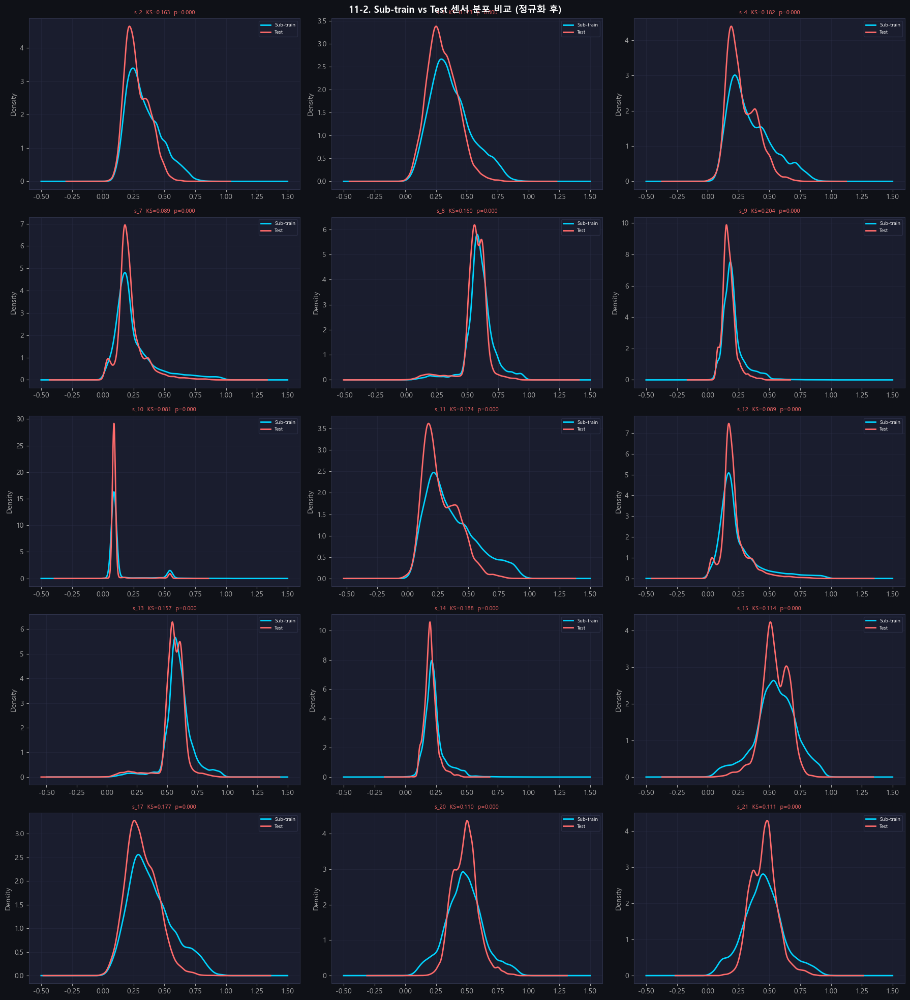

,KS,p-value,판정
센서,,,
s_2,0.1626,0.0,차이 ⚠️
s_3,0.1727,0.0,차이 ⚠️
s_4,0.1819,0.0,차이 ⚠️
s_7,0.0890,0.0,차이 ⚠️
s_8,0.1605,0.0,차이 ⚠️
s_9,0.2042,0.0,차이 ⚠️
s_10,0.0810,0.0,차이 ⚠️
s_11,0.1741,0.0,차이 ⚠️
s_12,0.0886,0.0,차이 ⚠️



분포 유사: 0/15개


In [71]:
from scipy.stats import ks_2samp as _ks2samp

fig, axes = plt.subplots(5, 3, figsize=(18, 20))
fig.suptitle('11-2. Sub-train vs Test 센서 분포 비교 (정규화 후)', fontsize=13, fontweight='bold')
ks_rows = []
for ax, s in zip(axes.flat, USEFUL_SENSORS):
    tr_v = subtrain_s4[s].dropna(); te_v = test_s4[s].dropna()
    stat, p = _ks2samp(tr_v, te_v)
    ks_rows.append({'센서':s,'KS':round(stat,4),'p-value':round(p,4),
                    '판정':'유사 ✅' if p>0.05 else '차이 ⚠️'})
    color = C[2] if p>0.05 else C[1]
    try: tr_v.plot.kde(ax=ax, color=C[0], lw=2, label='Sub-train')
    except: pass
    try: te_v.plot.kde(ax=ax, color=color, lw=2, label='Test')
    except: pass
    ax.set_title(f'{s}  KS={stat:.3f}  p={p:.3f}', fontsize=8, color=C[2] if p>0.05 else C[1])
    ax.legend(fontsize=7)
for ax in axes.flat[len(USEFUL_SENSORS):]: ax.set_visible(False)
plt.tight_layout(); plt.show()
ks_df = pd.DataFrame(ks_rows).set_index('센서')
display(ks_df)
print(f'\n분포 유사: {(ks_df["판정"]=="유사 ✅").sum()}/{len(USEFUL_SENSORS)}개')


### 11-3. 열화 트렌드 전후 비교 (원본 → 스무딩 → 정규화)

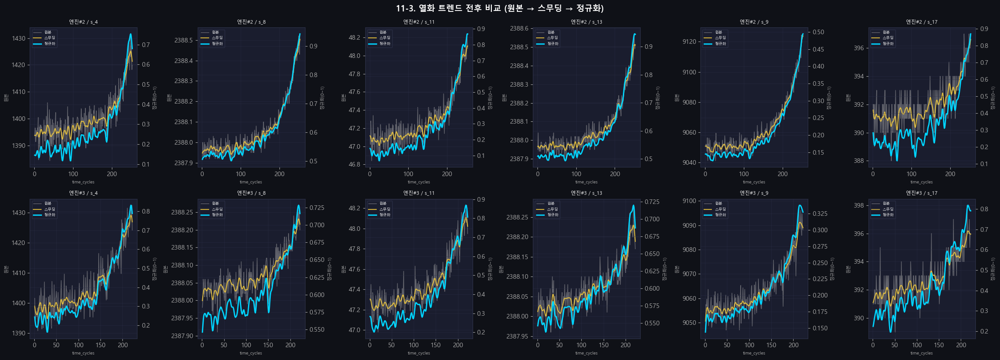

In [72]:
sample_sensors_73 = ['s_4','s_8','s_11','s_13','s_9','s_17']
sample_units_73   = subtrain['unit_nr'].unique()[:2]

fig, axes = plt.subplots(len(sample_units_73), len(sample_sensors_73), figsize=(22, 8))
fig.suptitle('11-3. 열화 트렌드 전후 비교 (원본 → 스무딩 → 정규화)', fontsize=13, fontweight='bold')

for ri, uid in enumerate(sample_units_73):
    raw_d    = train_raw[train_raw['unit_nr']==uid].sort_values('time_cycles')
    smooth_d = train_s3[train_s3['unit_nr']==uid].sort_values('time_cycles')
    norm_d   = subtrain_s4[subtrain_s4['unit_nr']==uid].sort_values('time_cycles')
    for ci, s in enumerate(sample_sensors_73):
        ax = axes[ri, ci]; ax2 = ax.twinx()
        ax.plot(raw_d['time_cycles'],    raw_d[s],    color=GRAY, lw=1, alpha=0.5, label='원본')
        ax.plot(smooth_d['time_cycles'], smooth_d[s], color=C[3], lw=1.5, alpha=0.8, label='스무딩')
        ax2.plot(norm_d['time_cycles'],  norm_d[s],   color=C[0], lw=2, label='정규화')
        ax.set_title(f'엔진#{uid} / {s}', fontsize=8)
        ax.set_xlabel('time_cycles',fontsize=7); ax.set_ylabel('원본',fontsize=7)
        ax2.set_ylabel('정규화(0~1)',fontsize=7)
        l1,lb1 = ax.get_legend_handles_labels(); l2,lb2 = ax2.get_legend_handles_labels()
        ax.legend(l1+l2, lb1+lb2, fontsize=6)
plt.tight_layout(); plt.show()


### 11-4. 고장 모드 혼재 영향 확인 [FD003 전용 ★]

=== 11-4. 고장 모드 혼재 영향 확인 (FD003 전용 ★) ===
목적: 전처리 후에도 고장 모드별 열화 트렌드 차이가 유지되는지 확인


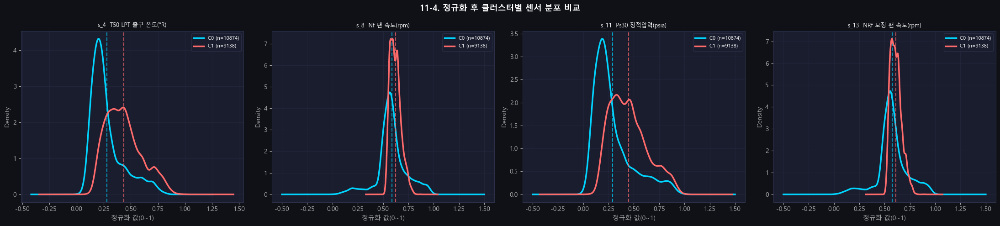

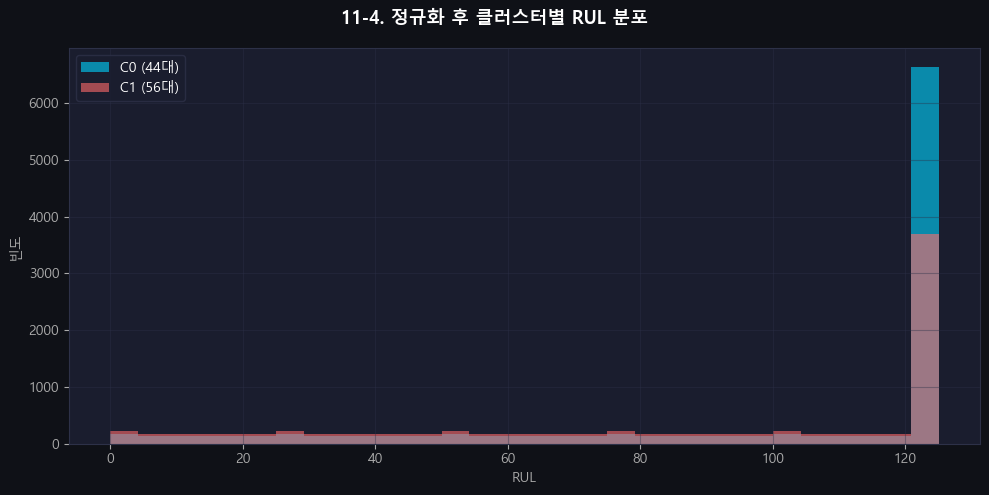

📌 전처리 후에도 클러스터 간 분포 차이 유지 → fault_mode_cluster 피처 정보량 확인


In [73]:
print('=== 11-4. 고장 모드 혼재 영향 확인 (FD003 전용 ★) ===')
print('목적: 전처리 후에도 고장 모드별 열화 트렌드 차이가 유지되는지 확인')

tr_check = subtrain_s4.copy()
tr_check['fault_mode_cluster'] = tr_check['unit_nr'].map(slope_df['fault_mode_cluster']).fillna(-1).astype(int)

show_sensors_74 = ['s_4','s_8','s_11','s_13']
fig, axes = plt.subplots(1, 4, figsize=(22, 5))
fig.suptitle('11-4. 정규화 후 클러스터별 센서 분포 비교', fontsize=13, fontweight='bold')
for ax, s in zip(axes, show_sensors_74):
    for c, color in zip([0,1],[C[0],C[1]]):
        data = tr_check[tr_check['fault_mode_cluster']==c][s].dropna()
        if len(data)>1:
            try: data.plot.kde(ax=ax, color=color, lw=2.5, label=f'C{c} (n={len(data)})')
            except: pass
        ax.axvline(data.mean(), color=color, ls='--', lw=1.5, alpha=0.7)
    ax.set_title(f'{s}  {SENSOR_DESC.get(s,"")}', fontsize=9)
    ax.set_xlabel('정규화 값(0~1)'); ax.legend(fontsize=8)
plt.tight_layout(); plt.show()

# RUL 분포 확인
fig, ax = plt.subplots(figsize=(10, 5))
fig.suptitle('11-4. 정규화 후 클러스터별 RUL 분포', fontsize=13, fontweight='bold')
for c, color in zip([0,1],[C[0],C[1]]):
    units_c = slope_df[slope_df['fault_mode_cluster']==c].index
    rul_vals = subtrain_s4[subtrain_s4['unit_nr'].isin(units_c)]['RUL']
    ax.hist(rul_vals, bins=30, color=color, alpha=0.6, label=f'C{c} ({len(units_c)}대)')
ax.set_xlabel('RUL'); ax.set_ylabel('빈도'); ax.legend()
plt.tight_layout(); plt.show()
print('📌 전처리 후에도 클러스터 간 분포 차이 유지 → fault_mode_cluster 피처 정보량 확인')


### 11-5. ML 파생변수 다중공선성 확인 (|r|>0.95)

In [74]:
# ML 파생변수 생성 후 다중공선성 확인 (Section 12 실행 후 자동 동작)
# 아래 코드는 Section 12에서 subtrain_ml과 ML_FEATURES 변수 생성 후 실행됩니다.
print('※ ML 파생변수 다중공선성 확인은 Section 12 실행 후 아래 코드가 동작합니다.')

def check_multicollinearity(df_ml, ML_FEATURES, HIGH_THR=0.95):
    print(f'=== ML 다중공선성 확인 (|r|>{HIGH_THR}) — {len(ML_FEATURES)}개 피처 ===')
    corr_ml  = df_ml[ML_FEATURES].corr().abs()
    upper_ml = corr_ml.where(np.triu(np.ones(corr_ml.shape),k=1).astype(bool))
    high_pairs = (upper_ml.stack().reset_index()
                  .rename(columns={'level_0':'피처A','level_1':'피처B',0:'|r|'})
                  .query(f'`|r|` >= {HIGH_THR}')
                  .sort_values('|r|',ascending=False).reset_index(drop=True))
    print(f'|r|≥{HIGH_THR} 쌍: {len(high_pairs)}개 / 전체 {len(ML_FEATURES)*(len(ML_FEATURES)-1)//2}쌍')
    if len(high_pairs): display(high_pairs.head(20))
    print('→ 실제 제거는 모델 피처 중요도 확인 후 결정 권장')


※ ML 파생변수 다중공선성 확인은 Section 12 실행 후 아래 코드가 동작합니다.


---
## 12. [ML 분기] 시계열 파생변수 생성 + 정규화

In [75]:
# ML 파생변수 생성 (정규화 전 smoothed 데이터 기준)
subtrain_ml_raw = build_ml_features(subtrain, USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)
valid_ml_raw    = build_ml_features(valid,    USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)
test_ml_raw     = build_ml_features(test_s3,  USEFUL_SENSORS,
    TEMPORAL_LAGS, TEMPORAL_DIFFS, TEMPORAL_ROLLS, TEMPORAL_ROLL_STDS, TEMPORAL_EMAS)

# CLUSTERING 분기: fault_mode_cluster OHE 추가
if CLUSTERING:
    for df_ in [subtrain_ml_raw, valid_ml_raw, test_ml_raw]:
        df_['cluster_0'] = (df_['unit_nr'].map(slope_df['fault_mode_cluster'])==0).astype(np.float32)
        df_['cluster_1'] = (df_['unit_nr'].map(slope_df['fault_mode_cluster'])==1).astype(np.float32)

ML_FEATURES = get_ml_feature_cols(subtrain_ml_raw)

# ML 전체 피처 MinMax 정규화 (sub-train 기준 fit)
ml_scaler = MinMaxScaler()
ml_scaler.fit(subtrain_ml_raw[ML_FEATURES])

def normalize_ml(df, features, sc):
    df = df.copy(); df[features] = sc.transform(df[features]); return df

subtrain_ml = normalize_ml(subtrain_ml_raw, ML_FEATURES, ml_scaler)
valid_ml    = normalize_ml(valid_ml_raw,    ML_FEATURES, ml_scaler)
test_ml     = normalize_ml(test_ml_raw,     ML_FEATURES, ml_scaler)

print(f'✅ ML 파생변수 생성 & 정규화 완료')
print(f'   원본 센서: {len(USEFUL_SENSORS)}개 → ML 피처: {len(ML_FEATURES)}개')
print(f'   Sub-train: {subtrain_ml.shape}  Valid: {valid_ml.shape}  Test: {test_ml.shape}')

# test_last_ml (마지막 타임스텝 + 실제 RUL)
test_last_ml = (test_ml.sort_values(['unit_nr','time_cycles'])
                .groupby('unit_nr',as_index=False).last().reset_index(drop=True))
test_last_ml['RUL'] = rul_df['RUL'].values

# 다중공선성 확인
check_multicollinearity(subtrain_ml, ML_FEATURES)


✅ ML 파생변수 생성 & 정규화 완료
   원본 센서: 15개 → ML 피처: 150개
   Sub-train: (19612, 157)  Valid: (4608, 157)  Test: (16096, 155)
=== ML 다중공선성 확인 (|r|>0.95) — 150개 피처 ===
|r|≥0.95 쌍: 753개 / 전체 11175쌍


,피처A,피처B,|r|
0,s_12_lag1,s_12_roll3,0.999996
1,s_7_lag1,s_7_roll3,0.999994
2,s_14_lag1,s_14_roll3,0.999987
3,s_9_lag1,s_9_roll3,0.999984
4,s_12_roll5,s_12_ema5,0.999970
5,s_15_lag1,s_15_roll3,0.999960
6,s_7_roll5,s_7_ema5,0.999959
7,s_10_lag1,s_10_roll3,0.999958
8,s_11_lag1,s_11_roll3,0.999955
9,s_21_lag1,s_21_roll3,0.999935


→ 실제 제거는 모델 피처 중요도 확인 후 결정 권장


---
## 13. [DL 분기] 슬라이딩 윈도우 생성

In [76]:
X_subtrain_dl, y_subtrain_dl = create_sliding_windows(subtrain_s4, DL_FEATURES, 'RUL')
X_valid_dl,    y_valid_dl    = create_sliding_windows(valid_s4,    DL_FEATURES, 'RUL')
X_test_dl,     y_test_dl     = create_test_windows(  test_s4,     DL_FEATURES, rul_df['RUL'])

dl_subtrain_long = windows_to_long_df(X_subtrain_dl, y_subtrain_dl, DL_FEATURES)
dl_valid_long    = windows_to_long_df(X_valid_dl,    y_valid_dl,    DL_FEATURES)
dl_test_long     = windows_to_long_df(X_test_dl,     y_test_dl,     DL_FEATURES)

print(f'✅ DL 슬라이딩 윈도우 생성 완료')
print(f'   WINDOW_SIZE={WINDOW_SIZE}  DL_FEATURES={len(DL_FEATURES)}채널  CLUSTERING={CLUSTERING}')
print(f'   X_subtrain: {X_subtrain_dl.shape}  y: {y_subtrain_dl.shape}')
print(f'   X_valid   : {X_valid_dl.shape}     y: {y_valid_dl.shape}')
print(f'   X_test    : {X_test_dl.shape}      y: {y_test_dl.shape}')
print(f'   Long Format: sub={dl_subtrain_long.shape}  val={dl_valid_long.shape}  test={dl_test_long.shape}')


✅ DL 슬라이딩 윈도우 생성 완료
   WINDOW_SIZE=30  DL_FEATURES=15채널  CLUSTERING=False
   X_subtrain: (17692, 30, 15)  y: (17692,)
   X_valid   : (4128, 30, 15)     y: (4128,)
   X_test    : (100, 30, 15)      y: (100,)
   Long Format: sub=(530760, 18)  val=(123840, 18)  test=(3000, 18)


### 13-1. val_eval 생성 — 수명 50~90% 랜덤 절단 (seed=42)

=== val_eval 생성 (수명 50~90% 절단, seed=42) ===
기존 val_eval RUL 평균: 0.0 (≈0에 가까움 → 평가 왜곡)
개선 val_eval RUL 평균: 65.8 (test 분포와 유사)
ML val_eval: (20, 153)  |  DL val_eval: (600, 18)


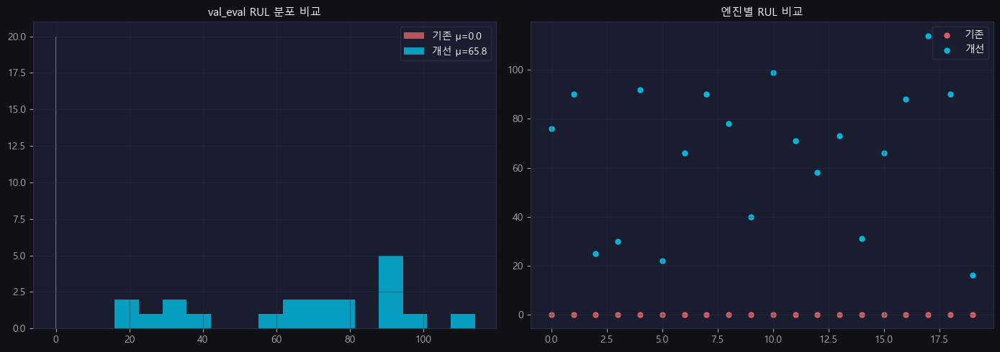

✅ val_eval 생성 완료


In [77]:
print('=== val_eval 생성 (수명 50~90% 절단, seed=42) ===')

def make_val_eval(df_ml, df_dl, features_ml, features_dl, window,
                  cut_low=0.5, cut_high=0.9, random_state=42):
    """수명 50~90% 사이에서 절단 — test와 유사한 RUL 분포 생성 (ML + DL)."""
    rng = np.random.RandomState(random_state)
    ml_rows, dl_rows = [], []
    common_units = sorted(set(df_ml['unit_nr'].unique()) & set(df_dl['unit_nr'].unique()))
    for uid in common_units:
        sub_ml = df_ml[df_ml['unit_nr']==uid].sort_values('time_cycles').reset_index(drop=True)
        sub_dl = df_dl[df_dl['unit_nr']==uid].sort_values('time_cycles').reset_index(drop=True)
        n_ml, n_dl = len(sub_ml), len(sub_dl)
        if n_ml<2 or n_dl<window: continue
        cut_i = rng.randint(max(1,int(n_ml*cut_low)), int(n_ml*cut_high)+1)
        cut_i = max(1, min(cut_i, n_ml))
        ml_cols = [c for c in ['unit_nr','time_cycles']+features_ml+['RUL']
                   if c in sub_ml.columns and c!='fault_mode_cluster']
        ml_rows.append(sub_ml.iloc[cut_i-1][ml_cols].to_dict())
        cut_ratio = (cut_i-1)/max(n_ml-1,1)
        cut_dl    = max(window, min(int(cut_ratio*n_dl)+1, n_dl))
        seg       = sub_dl.iloc[cut_dl-window:cut_dl]
        if len(seg)==window:
            rul_at_cut = sub_ml.iloc[cut_i-1]['RUL']
            for t_i, (_, r) in enumerate(seg.iterrows()):
                dr = {'sample_id':uid,'timestep':t_i}
                for feat in features_dl: dr[feat] = r[feat] if feat in r.index else np.nan
                dr['RUL'] = rul_at_cut
                dl_rows.append(dr)
    return pd.DataFrame(ml_rows), pd.DataFrame(dl_rows)

val_eval_ml, dl_val_eval_long = make_val_eval(
    valid_ml, valid_s4, ML_FEATURES, DL_FEATURES, WINDOW_SIZE)

y_ve = val_eval_ml['RUL'].values if 'RUL' in val_eval_ml.columns else np.array([])
old_rul = np.array([
    float(valid_s4[valid_s4['unit_nr']==uid].sort_values('time_cycles')['RUL'].iloc[-1])
    for uid in np.sort(valid_s4['unit_nr'].unique())
])

print(f'기존 val_eval RUL 평균: {old_rul.mean():.1f} (≈0에 가까움 → 평가 왜곡)')
print(f'개선 val_eval RUL 평균: {y_ve.mean():.1f} (test 분포와 유사)')
print(f'ML val_eval: {val_eval_ml.shape}  |  DL val_eval: {dl_val_eval_long.shape}')

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].hist(old_rul, bins=15, color=C[1], alpha=0.7, label=f'기존 μ={old_rul.mean():.1f}')
axes[0].hist(y_ve,    bins=15, color=C[0], alpha=0.7, label=f'개선 μ={y_ve.mean():.1f}')
axes[0].set_title('val_eval RUL 분포 비교'); axes[0].legend()
axes[1].scatter(range(len(old_rul)), old_rul, color=C[1], s=25, alpha=0.8, label='기존')
axes[1].scatter(range(len(y_ve)),   y_ve,     color=C[0], s=25, alpha=0.8, label='개선')
axes[1].set_title('엔진별 RUL 비교'); axes[1].legend()
plt.tight_layout(); plt.show()
print('✅ val_eval 생성 완료')
